In [1]:
library(reticulate)
# use_python("/opt/conda/envs/GSI/bin/python3.10",required=T)
# py_config()
library(rhdf5)
library(Seurat)
library(ggplot2)
library(dplyr)
library(readr)
library(spatialLIBD)
library(aricode)
library(glue)
library(patchwork)
library(arrow)
library(harmony)
source('/workspace/volume/spatial_integration/BEER/BEER.R')

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: SpatialExperiment

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package

[1] "Welcome to BEER (v0.1.9)!"


Loading required package: mgcv

Loading required package: nlme


Attaching package: ‘nlme’


The following object is masked from ‘package:IRanges’:

    collapse


The following object is masked from ‘package:dplyr’:

    collapse


This is mgcv 1.9-0. For overview type 'help("mgcv-package")'.

Loading required package: genefilter


Attaching package: ‘genefilter’


The following object is masked from ‘package:patchwork’:

    area


The following objects are masked from ‘package:MatrixGenerics’:

    rowSds, rowVars


The following objects are masked from ‘package:matrixStats’:

    rowSds, rowVars


The following object is masked from ‘package:readr’:

    spec


Loading required package: BiocParallel


Attaching package: ‘limma’


The following object is masked from ‘package:BiocGenerics’:

    plotMA




In [2]:
sessionInfo()

R version 4.3.0 (2023-04-21)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 20.04.5 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/blas/libblas.so.3.9.0 
LAPACK: /usr/lib/x86_64-linux-gnu/lapack/liblapack.so.3.9.0

locale:
 [1] LC_CTYPE=C.UTF-8    LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C      
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Asia/Seoul
tzcode source: system (glibc)

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] limma_3.56.2                sva_3.48.0                 
 [3] BiocParallel_1.34.2         genefilter_1.82.1          
 [5] mgcv_1.9-0                  nlme_3.1-162               
 [7] harmony_1.2.1               Rcpp_1.0.12                
 [9] arrow_16.1.0                patchwork_1.1.3.9

In [3]:
getwd()

[1] "/workspace/volume/spatial_integration/GNN_based/combined"

In [4]:
dataset_folder = '/workspace/volume/spatial_integration/GNN_based/combined/processed_data'
data_embed_name = '5thset_embed_all_com3all_unfil'

In [5]:
file.path(dataset_folder,'spe_all.rds')

[1] "/workspace/volume/spatial_integration/GNN_based/combined/processed_data/spe_all.rds"

In [6]:
start_time = Sys.time()
# Sys.sleep(60)
end_time = Sys.time()
duration = end_time - start_time

print(start_time)
print(end_time)
print(duration)

[1] "2024-09-09 14:04:48 KST"
[1] "2024-09-09 14:04:48 KST"
Time difference of 0.0005719662 secs


In [7]:
spe_all <- readRDS(file.path(dataset_folder,'/spe_all.rds'))
D1=readRDS(file.path(dataset_folder,'/df_logcount_673.rds'))
D2=readRDS(file.path(dataset_folder,'/df_logcount_674.rds'))
D3=readRDS(file.path(dataset_folder,'/df_logcount_675.rds'))
D4=readRDS(file.path(dataset_folder,'/df_logcount_676.rds'))

In [8]:
# D1=readRDS('/home/spatial_integration/spatialLIBD/r_lib/assay_151674.rds')
# D2=readRDS('spatialLIBD/r_lib/assay_151675.rds')
# D3=readRDS('spatialLIBD/r_lib/assay_151674.rds')

BATCH_default =c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)),
        rep('D4',ncol(D4)) )

D12=.simple_combine(D1,D2)$combine
D123=.simple_combine(D12,D3)$combine
D1234=.simple_combine(D123,D4)$combine

DATA_default = D1234

# rm(D1);rm(D2);rm(D3);rm(D12)

In [9]:
print(sprintf('processed_data/%s.csv', data_embed_name))

[1] "processed_data/5thset_embed_all_com3all_unfil.csv"


In [10]:
start_time <- Sys.time()

# DATA <- read_csv('/workspace/volume/spatial_integration/dataset/datapoints/embed_all_com3_unfil.csv', name_repair='minimal')
DATA <- read_csv(sprintf('processed_data/%s.csv', data_embed_name), name_repair='minimal')
end_time <- Sys.time()
duration <- end_time - start_time
print(duration)

Rows: 67076 Columns: 14365
── Column specification ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Delimiter: ","
chr     (1): 
dbl (14364): AAACAAGTATCTCCCA-1, AAACAATCTACTAGCA-1, AAACACCAATAACTGC-1, AAA...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Time difference of 35.71119 secs


In [11]:
spe_673 <- spe_all[, spe_all$sample_id == '151673']
spe_674 <- spe_all[, spe_all$sample_id == '151674']
spe_675 <- spe_all[, spe_all$sample_id == '151675']
spe_676 <- spe_all[, spe_all$sample_id == '151676']

In [12]:
LAYER=c(colData(spe_673)$'layer_guess',
        colData(spe_674)$'layer_guess',
        colData(spe_675)$'layer_guess',
        colData(spe_676)$'layer_guess')

In [13]:
class(LAYER)

[1] "factor"

In [14]:
write.csv(colData(spe_673)['layer_guess'],'layer_673_pos.csv',row.names=TRUE)
write.csv(colData(spe_674)['layer_guess'],'layer_674_pos.csv',row.names=TRUE)
write.csv(colData(spe_675)['layer_guess'],'layer_675_pos.csv',row.names=TRUE)
write.csv(colData(spe_676)['layer_guess'],'layer_676_pos.csv',row.names=TRUE)

In [15]:
# LAYER_674=(colData(spe_674)$'layer_guess')        
# LAYER_675=(colData(spe_675)$'layer_guess')
# LAYER_674=(colData(spe_674)$'layer_guess')+

In [16]:
# write.csv(as.data.frame(LAYER_674),'layer_674.csv', row.names=FALSE)
# write.csv(as.data.frame(LAYER_675),'layer_675.csv', row.names=FALSE)
# write.csv(as.data.frame(LAYER_674),'layer_674.csv', row.names=FALSE)

In [17]:
char_layer <- as.character(LAYER)
# char_layer

In [18]:
names(colData(spe_all))

[1] "sample_id"                   "Cluster"                    
 [3] "sum_umi"                     "sum_gene"                   
 [5] "subject"                     "position"                   
 [7] "replicate"                   "subject_position"           
 [9] "discard"                     "key"                        
[11] "cell_count"                  "SNN_k50_k4"                 
[13] "SNN_k50_k5"                  "SNN_k50_k6"                 
[15] "SNN_k50_k7"                  "SNN_k50_k8"                 
[17] "SNN_k50_k9"                  "SNN_k50_k10"                
[19] "SNN_k50_k11"                 "SNN_k50_k12"                
[21] "SNN_k50_k13"                 "SNN_k50_k14"                
[23] "SNN_k50_k15"                 "SNN_k50_k16"                
[25] "SNN_k50_k17"                 "SNN_k50_k18"                
[27] "SNN_k50_k19"                 "SNN_k50_k20"                
[29] "SNN_k50_k21"                 "SNN_k50_k22"                
[31] "SNN_k50_k23"                 "SNN_k50_k24"                
[33] "SNN_k50_k25"                 "SNN_k50_k26"                
[35] "SNN_k50_k27"                 "SNN_k50_k28"                
[37] "GraphBased"                  "Maynard"                    
[39] "Martinowich"                 "layer_guess"                
[41] "layer_guess_reordered"       "layer_guess_reordered_short"
[43] "expr_chrM"                   "expr_chrM_ratio"            
[45] "SpatialDE_PCA"               "SpatialDE_pool_PCA"         
[47] "HVG_PCA"                     "pseudobulk_PCA"             
[49] "markers_PCA"                 "SpatialDE_UMAP"             
[51] "SpatialDE_pool_UMAP"         "HVG_UMAP"                   
[53] "pseudobulk_UMAP"             "markers_UMAP"               
[55] "SpatialDE_PCA_spatial"       "SpatialDE_pool_PCA_spatial" 
[57] "HVG_PCA_spatial"             "pseudobulk_PCA_spatial"     
[59] "markers_PCA_spatial"         "SpatialDE_UMAP_spatial"     
[61] "SpatialDE_pool_UMAP_spatial" "HVG_UMAP_spatial"           
[63] "pseudobulk_UMAP_spatial"     "markers_UMAP_spatial"       
[65] "spatialLIBD"                 "ManualAnnotation"           
[67] "in_tissue"                   "array_row"                  
[69] "array_col"

In [19]:
spe_all[]

class: SpatialExperiment 
dim: 33538 47681 
metadata(0):
assays(2): counts logcounts
rownames(33538): ENSG00000243485 ENSG00000237613 ... ENSG00000277475
  ENSG00000268674
rowData names(9): source type ... gene_search is_top_hvg
colnames(47681): AAACAACGAATAGTTC-1 AAACAAGTATCTCCCA-1 ...
  TTGTTTCCATACAACT-1 TTGTTTGTGTAAATTC-1
colData names(69): sample_id Cluster ... array_row array_col
reducedDimNames(6): PCA TSNE_perplexity50 ... TSNE_perplexity80
  UMAP_neighbors15
mainExpName: NULL
altExpNames(0):
spatialCoords names(2) : pxl_col_in_fullres pxl_row_in_fullres
imgData names(4): sample_id image_id data scaleFactor

In [20]:
coords <- spatialCoords(spe_676)
# write.csv(coords,'pxl_col-row.csv')

In [21]:
array <- as.data.frame(colData(spe_676)[c('array_col','array_row')])
# write.csv(array, 'array_col-row.csv')

In [22]:
class(char_layer)
length(char_layer)

[1] "character"

[1] 14364

In [23]:
BATCH=c(rep('D1',ncol(D1)),
        rep('D2',ncol(D2)),
        rep('D3',ncol(D3)),
        rep('D4',ncol(D4)))

In [24]:
length(BATCH)

[1] 14364

In [25]:
D1

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0.000000,0.000000,0,0.0000000,0,0,0.000000,0.000000,0.000000,0.0000000


In [26]:
D2

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000237613,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000186092,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000238009,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000239945,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000239906,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000241599,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000236601,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000
ENSG00000284733,0.0000000,0,0.0000000,0.0000000,0.0000000,0,0.000000,0.0000000,0.0000000,0.0000000,⋯,0.000000,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0,0.000000


In [27]:
D3

,AAACAACGAATAGTTC-1,AAACAAGTATCTCCCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,AAACCGTTCGTCCAGG-1,⋯,TTGTGGTGGTACTAAG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTATTACACG-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000237613,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000186092,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000238009,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000239945,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000239906,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000241599,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000236601,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000
ENSG00000284733,0,0.0000000,0.000000,0.0000000,0,0,0,0.0000000,0.000000,0,⋯,0.0000000,0,0.000000,0,0,0.0000000,0,0,0.000000,0.000000


In [28]:
DATA_default

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGGTGGTACTAAG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000000003,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000000005,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000000419,0.0000000,1.534957,0.9662463,0.7453531,0.0000000,0.0000000,0.000000,0.0000000,0.3285706,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000000457,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,1.281702,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000000460,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000000938,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000000971,0.4655466,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000001036,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000,0,0.000000
ENSG00000001084,0.0000000,0.000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.0000000,2.126234,1.22812,0.000000,0,0,0.000000,0.000000,0,0.000000


In [29]:
DATA

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,⋯,TTGTGGTGGTACTAAG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000


In [30]:
DATA_df <- as.data.frame(DATA)
DATA_df

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,⋯,TTGTGGTGGTACTAAG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000


In [31]:
rownames(DATA_df) = DATA_df[,1]

In [32]:
DATA_df[,1] <- NULL

In [33]:
DATA_df

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGGTGGTACTAAG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000


In [34]:
DATA <- DATA_df
DATA

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,TTGTGGTGGTACTAAG-1,TTGTGTATGCCACCAA-1,TTGTGTTTCCCGAAAG-1,TTGTTAGCAAATTCGA-1,TTGTTCAGTGTGCTAC-1,TTGTTGTGTGTCAAGA-1,TTGTTTCACATCCAGG-1,TTGTTTCATTAGTCTA-1,TTGTTTCCATACAACT-1,TTGTTTGTGTAAATTC-1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0,0.00000,0.000000,0.00000,0.000000,0,0,0.000000,0.000000


In [35]:
# type(DATA)

In [36]:
data_rownames <- rownames(DATA)
data_rownames_duplicated <- duplicated(data_rownames)
data_rownames[data_rownames_duplicated]

character(0)

In [37]:
D1_spat <- DATA[,1:4226]
D1_spat

,AAACAAGTATCTCCCA-1,AAACAATCTACTAGCA-1,AAACACCAATAACTGC-1,AAACAGAGCGACTCCT-1,AAACAGCTTTCAGAAG-1,AAACAGGGTCTATATT-1,AAACAGTGTTCCTGGG-1,AAACATTTCCCGGATT-1,AAACCCGAACGAAATC-1,AAACCGGGTAGGTACC-1,⋯,AGGCAGATGCGTAAAC-1.1,AGGCAGGGAGCGTACT-1.1,AGGCATTGTCGTAGGG-1.1,AGGCCACCCGTTATGA-1.1,AGGCCCAGTGACTGGT-1,AGGCCCATTGTACAGG-1.1,AGGCCCTAGAACGCCA-1.1,AGGCCTGAGAATCTCG-1.1,AGGCGGTTTGTCCCGC-1.1,AGGCTATGGTTAGCTT-1.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000237613,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000186092,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000238009,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000239945,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000239906,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000241599,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000236601,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000
ENSG00000284733,0.0000000,0.00000,0.0000000,0,0.0000000,0,0,0.0000000,0.0000000,0,⋯,0,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0,0.0000000,0.000000,0.0000000


In [38]:
# type(D1_spat)

In [39]:
D2_spat <- DATA[,4227:8241]
D2_spat

,AGGCTTCCCGAAGAAG-1,AGGCTTGCTAGACACC-1,AGGGAAACGAGGTACT-1,AGGGACAGCACGGCGG-1,AGGGACCGGCTGCGTT-1,AGGGACTCTACGCGAC-1,AGGGAGACATACTTCG-1,AGGGCAGCGGCGTGGT-1,AGGGCGAGCAGCTGAT-1,AGGGCGTGATCGGCTA-1,⋯,CAATAAACCTTGGCCC-1.1,CAATATTCTTGACCTA-1.1,CAATCCCTATACCAGC-1.1,CAATGCGAGAAGTATC-1.1,CAATGGAATCTACATA-1.1,CAATGGATCTCTACCA-1.1,CAATGTGCCAACCCTT-1,CAATTAAGGGTGATGA-1.1,CAATTTCGTATAAGGG-1.1,CAATTTGACCGGGAAG-1.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000237613,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000186092,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000238009,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000239945,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000239906,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000241599,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000236601,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0
ENSG00000284733,0,0.0000000,0.0000000,0.000000,0.000000,0,0,0.000000,0.000000,0.0000000,⋯,0.0000000,0,0.000000,0.0000000,0.000000,0.000000,0.0000000,0,0,0


In [40]:
D3_spat <- DATA[,8242:11880]
D3_spat

,CACAAACCGCAGAACT-1,CACAAGCTAAGAAAGG-1,CACAATGAGCTGCTAT-1,CACACACGCTAACGAG-1,CACACAGCTTGCGCTC-1,CACACAGGGATAGATT-1,CACACGCGCTGTCTTA-1,CACACGTTTCAATGGG-1,CACAGAGACGAGGACG-1,CACAGCACCCACGGCA-1,⋯,CACTCCTATGTAAGAT-1.1,CACTCCTCTCGGTCGG-1.1,CACTCGAGCTGAACAA-1.1,CACTCTCAAGCATCGA-1.1,CACTCTTCTGCTAGCC-1.1,CACTGACGATTGTGGA-1.1,CACTGTCCAAGTGAGA-1.1,CACTTAATCAGACGGA-1.1,CACTTCGCCACAGGCT-1.1,CACTTCGTCTTATCTC-1.1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000243485,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000237613,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000186092,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000238009,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000239945,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000239906,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000241599,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000236601,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0
ENSG00000284733,0.0000000,0.0000000,0,0.000000,0.0000000,0.000000,0.0000000,0.0000000,0.00000,0.000000,⋯,0,0.0000000,0,0,0.0000000,0.000000,0.000000,0.0000000,0.00000,0


In [41]:
length(BATCH)

[1] 14364

In [42]:
class(BATCH)

[1] "character"

In [43]:
dim(DATA_default)
dim(D1)
dim(D2)
dim(D3)
dim(D4)
dim(DATA)
# dim(D1_spat)
# dim(D2_spat)
# dim(D3_spat)

[1] 33538 14364

[1] 33538  3639

[1] 33538  3673

[1] 33538  3592

[1] 33538  3460

[1] 67076 14364

<h2>Integrated w/ spatial w/ Batch Effect Removal</h2>

In [44]:
data_rownames <- rownames(DATA)
data_rownames_duplicated <- duplicated(data_rownames)
data_rownames[data_rownames_duplicated]

character(0)

In [45]:
mybeer=BEER(DATA, BATCH, GNUM=50, PCNUM=30, ROUND=2, GN=1000, SEED=1, COMBAT=TRUE)

[1] "BEER start!"
[1] "2024-09-09 14:06:21 KST"


Loading required package: stringi



[1] "Group number (GNUM) is:"
[1] 50
[1] "Varible gene number (GN) of each batch is:"
[1] 1000
[1] "ROUND is:"
[1] 2
[1] 1
[1] "D1"
[1] 2
[1] "D2"
[1] 3
[1] "D3"
[1] 4
[1] "D4"
[1] "Total varible gene number (GN) is:"
[1] 3194


Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”


Found 474 genes with uniform expression within a single batch (all zeros); these will not be adjusted for batch.


Found4batches

Adjusting for0covariate(s) or covariate level(s)

Standardizing Data across genes

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting the Data


Centering and scaling data matrix



[1] "Calculating PCs ..."


PC_ 1 
Positive:  ENSG00000171368-spat 
Negative:  ENSG00000164830 

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
14:09:02 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

14:09:02 Read 14364 rows and found 30 numeric columns

14:09:02 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

14:09:02 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*


[1] "Get group for:"
[1] "D1"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D2"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D3"
[1] "Group Number:"
[1] 50
[1] "Get group for:"
[1] "D4"
[1] "Group Number:"
[1] 50
[1] "Finding MN pairs..."
[1] "1 / 200"
[1] "101 / 200"
[1] "ROUND:"
[1] 1
[1] "ROUND:"
[1] 2
[1] "Number of MN pairs:"
[1] 40
[1] "Evaluating PCs ..."
[1] "Start"


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 1


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 2


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 3


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 4


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 5


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 6


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 7


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 8


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 9


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 10


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 11


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 12


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 13


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 14


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 15


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 16


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 17


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 18


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 19


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 20


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 21


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 22


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 23


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 24


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 25


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 26


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 27


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 28


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 29


Warning message in cor.test.default(lst1_quantile, lst2_quantile, method = CORMETHOD):
“Cannot compute exact p-value with ties”


[1] 30
[1] "Finished!!!"
[1] "############################################################################"
[1] "BEER cheers !!! All main steps finished."
[1] "############################################################################"
[1] "2024-09-09 14:10:53 KST"


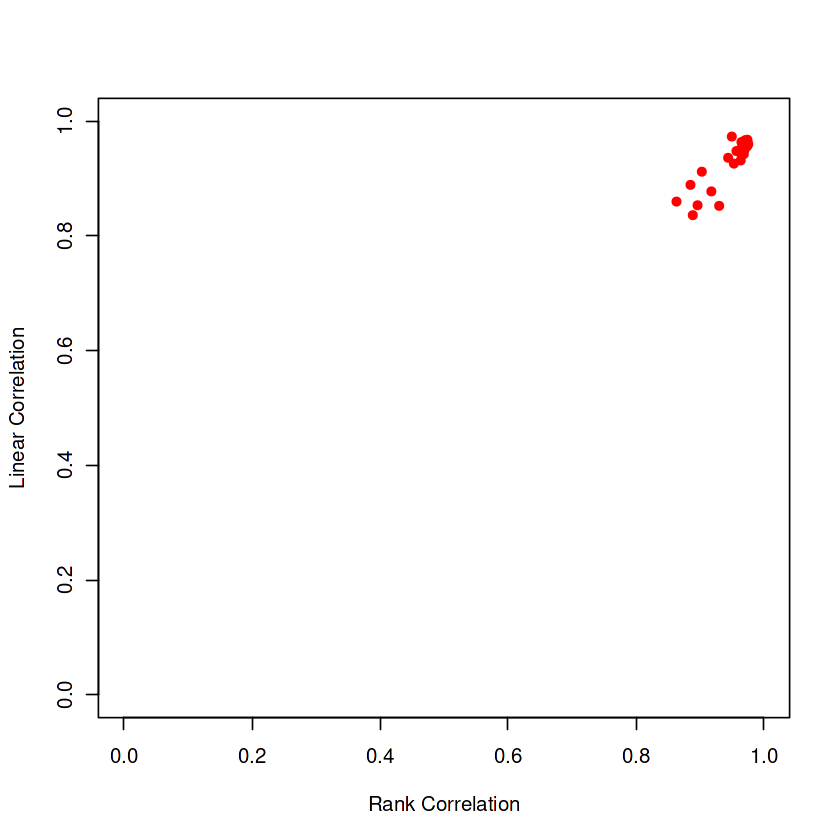

In [46]:
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

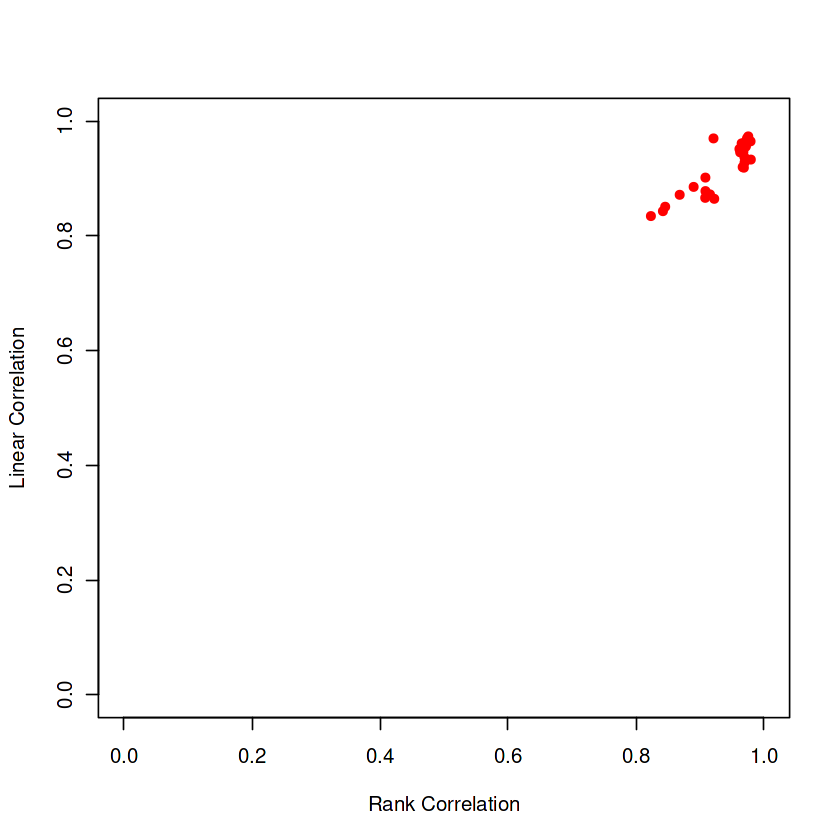

In [46]:
PCUSE=mybeer$select
COL=rep('black',length(mybeer$cor))
COL[PCUSE]='red'
plot(mybeer$cor,mybeer$lcor,pch=16,col=COL,
    xlab='Rank Correlation',ylab='Linear Correlation',xlim=c(0,1),ylim=c(0,1))

In [47]:
mybeer$seurat

An object of class Seurat 
67076 features across 14364 samples within 1 assay 
Active assay: RNA (67076 features, 3194 variable features)
 2 dimensional reductions calculated: pca, umap

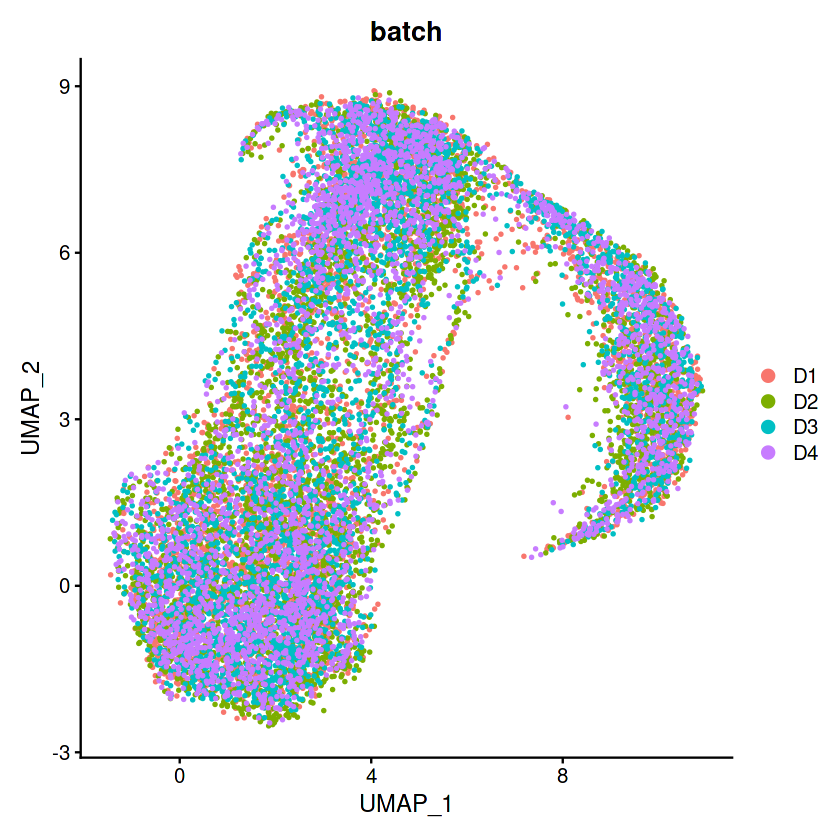

In [48]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.5)  

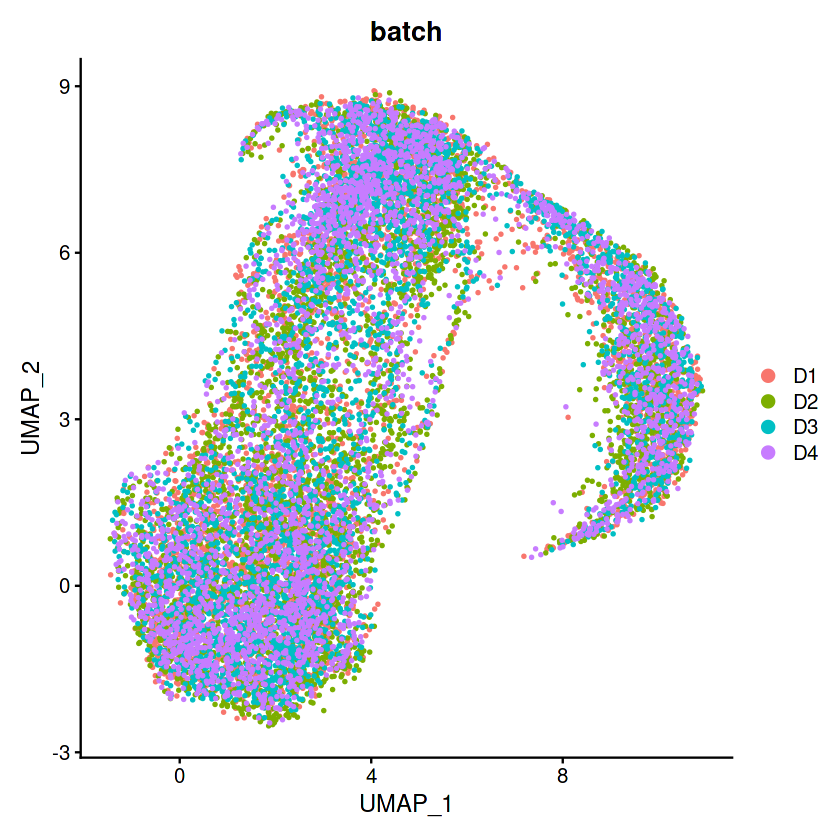

In [49]:
pbmc <- mybeer$seurat
PCUSE <- mybeer$select
pbmc@meta.data$orig.ident=char_layer
pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='batch', pt.size=0.5)  

In [50]:
length(unique(colnames(pbmc)))

[1] 14364

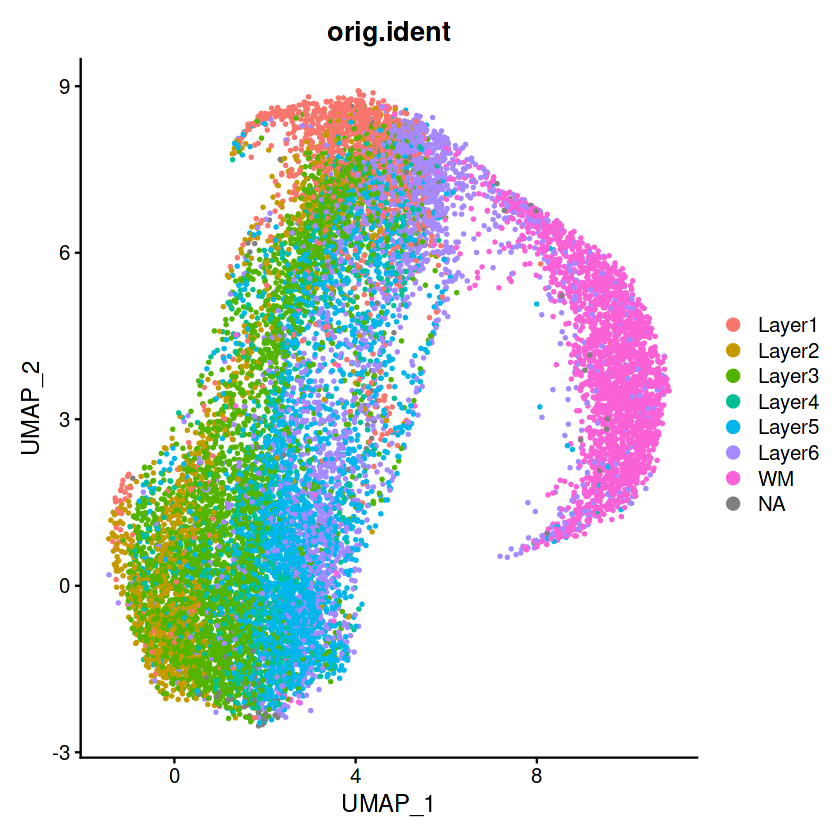

In [51]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.5)  

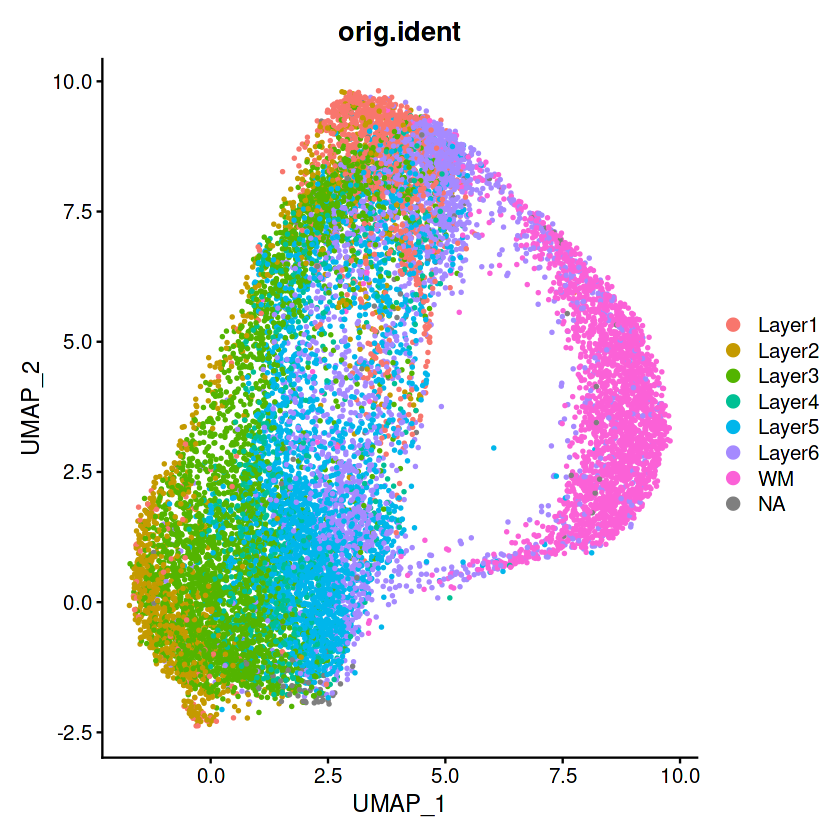

In [48]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.5)  

In [51]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')


# plot_save <- DimPlot(pbmc, reduction='umap', group.by='orig.ident', pt.size=0.5)
# ggsave('Ground_truth.png',plot_save)

In [127]:
pbmc <- FindNeighbors(object = pbmc, reduction='pca')
pbmc <- FindClusters(object = pbmc)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 434197

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7947
Number of communities: 11
Elapsed time: 1 seconds


In [53]:
# pbmc <- FindNeighbors(object = pbmc)
pbmc <- FindClusters(object = pbmc, resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 434197

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8374
Number of communities: 8
Elapsed time: 1 seconds


In [128]:
# pbmc <- FindNeighbors(object = pbmc)
pbmc <- FindClusters(object = pbmc, resolution = 0.485)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 434197

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8368
Number of communities: 7
Elapsed time: 2 seconds


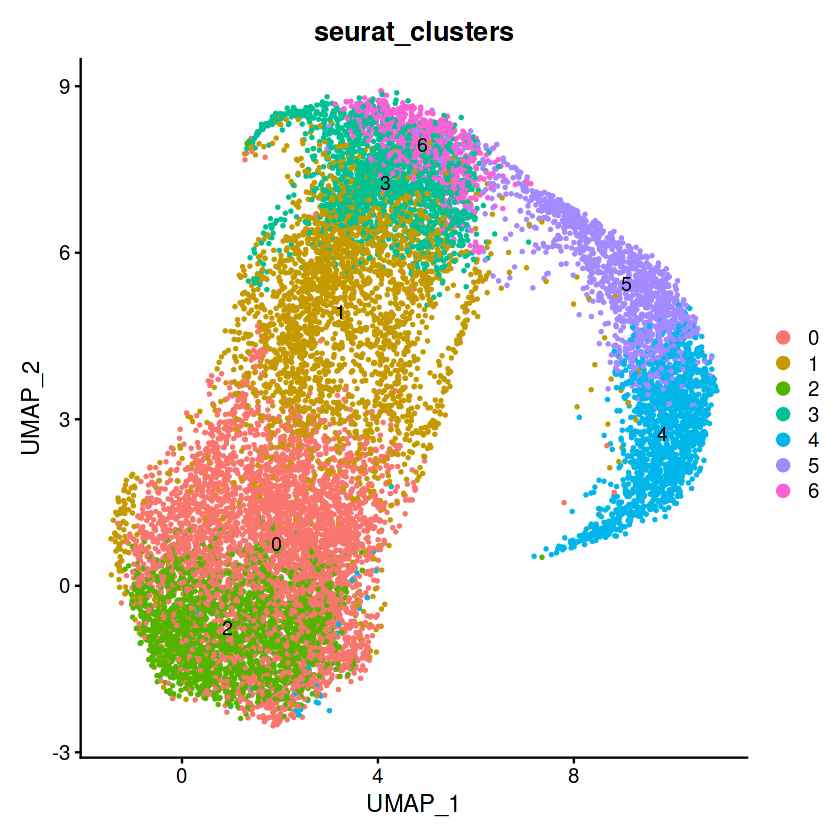

In [131]:
# pbmc <- mybeer$seurat
# PCUSE <- mybeer$select
# pbmc <- RunUMAP(object = pbmc, reduction='pca',dims = PCUSE, umap.method='umap-learn', metric='correlation')

plot_save <- DimPlot(pbmc, reduction='umap', group.by='seurat_clusters', pt.size=0.5, label=TRUE)
plot_save
# ggsave('Clustering_output.png',plot_save)

In [55]:
silhouette_seurat <- function(sobject,
                              cluster_col = "seurat_clusters",
                              dims = c(1:10)) {
    sil_obj <- cluster::silhouette(
        x = sobject@meta.data[[cluster_col]] %>%
            as.character() %>%
            as.numeric(),
        dist = Seurat::Embeddings(sobject,
                                  reduction = "pca")[, dims] %>%
        stats::dist())

    return(sil_obj)
}

In [132]:
listings = pbmc@meta.data[['batch']]
numbered_list <- as.integer(factor(listings, levels = unique(listings)))
batch_numeric <- numbered_list
names(batch_numeric) <- colnames(x=pbmc)
pbmc<- AddMetaData(
    object = pbmc,
    metadata = batch_numeric,
    col.name = 'batch_numeric'
    )
# head(x=pbmc)

In [133]:
listings = pbmc@meta.data[['orig.ident']]
numbered_list <- as.integer(factor(listings, levels = unique(listings)))
ident_numeric <- numbered_list
names(ident_numeric) <- colnames(x=pbmc)
pbmc<- AddMetaData(
    object = pbmc,
    metadata = ident_numeric,
    col.name = 'ident_numeric'
    )
# head(x=pbmc)

In [134]:
pbmc_nona_var <- pbmc[,!is.na(pbmc$orig.ident)]
pbmc_nona_var

An object of class Seurat 
67076 features across 14243 samples within 1 assay 
Active assay: RNA (67076 features, 3194 variable features)
 2 dimensional reductions calculated: pca, umap

In [54]:
pbmc_nona_var <- pbmc[,!is.na(pbmc$orig.ident)]
pbmc_nona_var

An object of class Seurat 
67076 features across 23829 samples within 1 assay 
Active assay: RNA (67076 features, 4466 variable features)
 2 dimensional reductions calculated: pca, umap

In [55]:
length(unique(colnames(pbmc_nona_var)))

[1] 23829

In [59]:
silhouette_mean <- function(sil_obj) {
    sil_summary <- summary(sil_obj)
    return(sil_summary$avg.width)
}

In [60]:
sil_obj <- silhouette_seurat(pbmc,"batch_numeric",PCUSE)
silhouette_mean(sil_obj)

[1] -0.008470618

In [61]:
sil_obj <- silhouette_seurat(pbmc_nona_var,"ident_numeric",PCUSE)
silhouette_mean(sil_obj)

[1] 0.001586548

In [59]:
clusts <- NULL
for (i in unique(pbmc$seurat_clusters)){
    clusts <- c(clusts, i)    
}
clusts

[1] "1" "2" "4" "0" "5" "3" "6"

In [60]:
ground <- NULL
for (i in unique(pbmc$orig.ident)){
    ground <- c(ground, i)    
}
ground

[1] "Layer3" "Layer1" "WM"     "Layer5" "Layer6" "Layer2" "Layer4" NA


Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
  1270   1006   3520    994   2675   2455   2323 


   0    1    2    3    4    5    6 
4052 2647 2246 1872 1495 1220  832 

[1] 14364

[1] 14243

[1] 14364

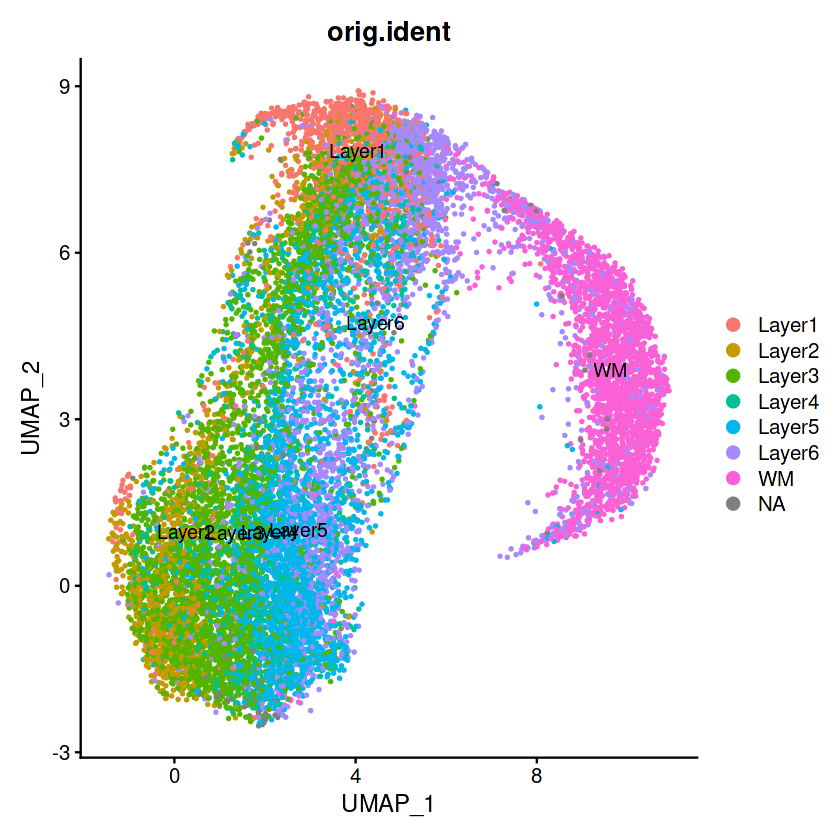

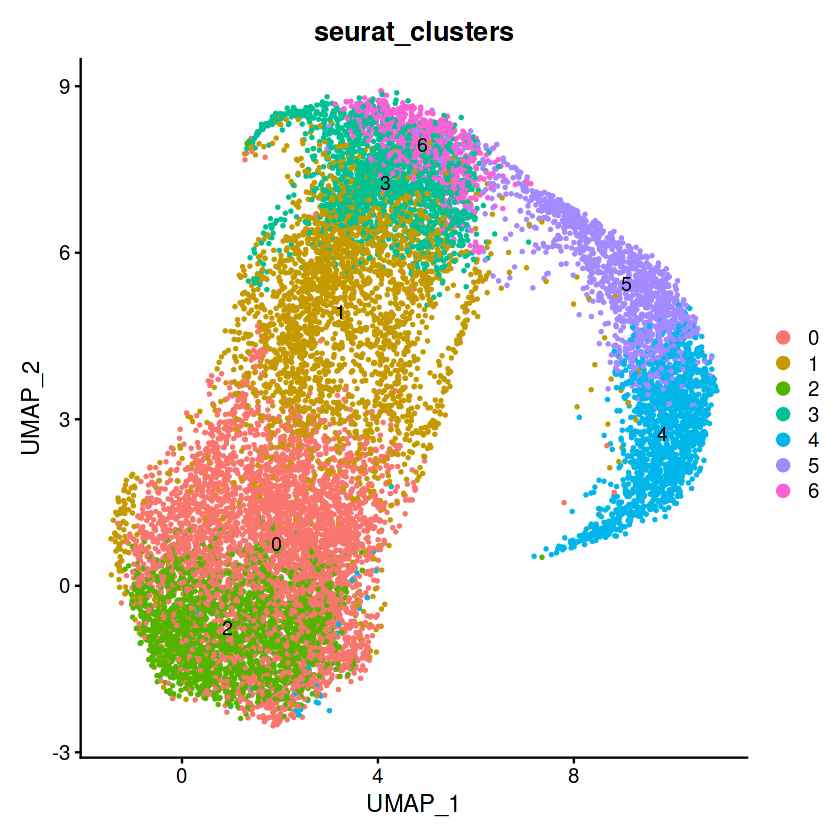

In [62]:
table(pbmc$orig.ident)
table(pbmc$seurat_clusters)
sum(table(pbmc$batch))
sum(table(pbmc$orig.ident))
sum(table(pbmc$seurat_clusters))
DimPlot(pbmc, reduction='umap',group.by='orig.ident', pt.size=0.5, label=TRUE) 
DimPlot(pbmc, reduction='umap',group.by='seurat_clusters', pt.size=0.5, label=TRUE) 


Layer1 Layer2 Layer3 Layer4 Layer5 Layer6     WM 
  2336   1077   8006   1756   4155   3959   2540 


   0    1    2    3    4    5    6 
6632 5860 3778 3683 2209 1344  541 

[1] 24047

[1] 23829

[1] 24047

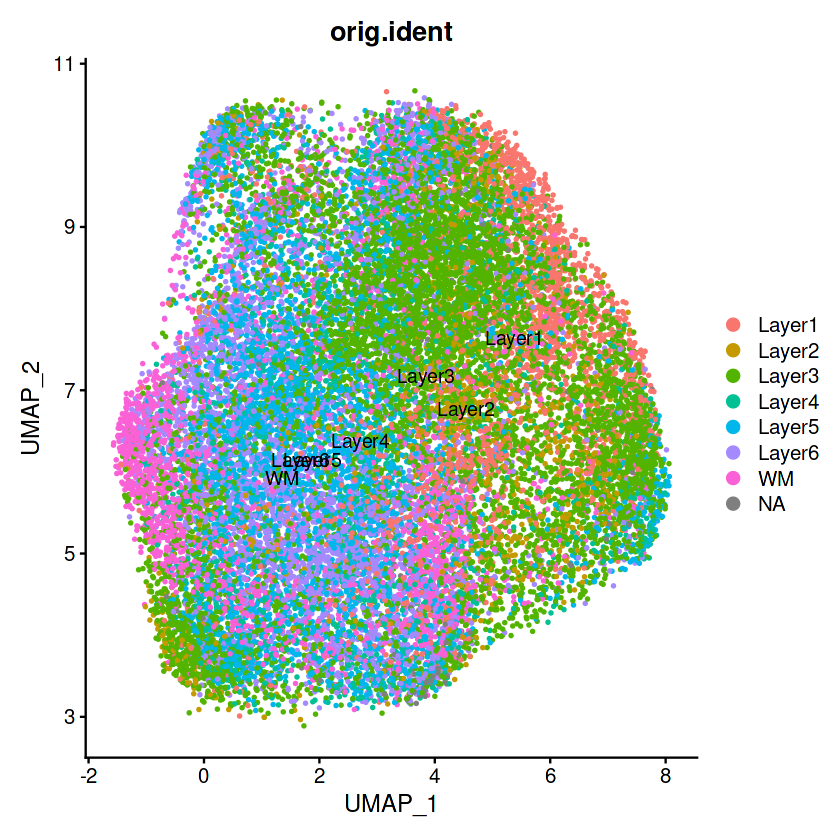

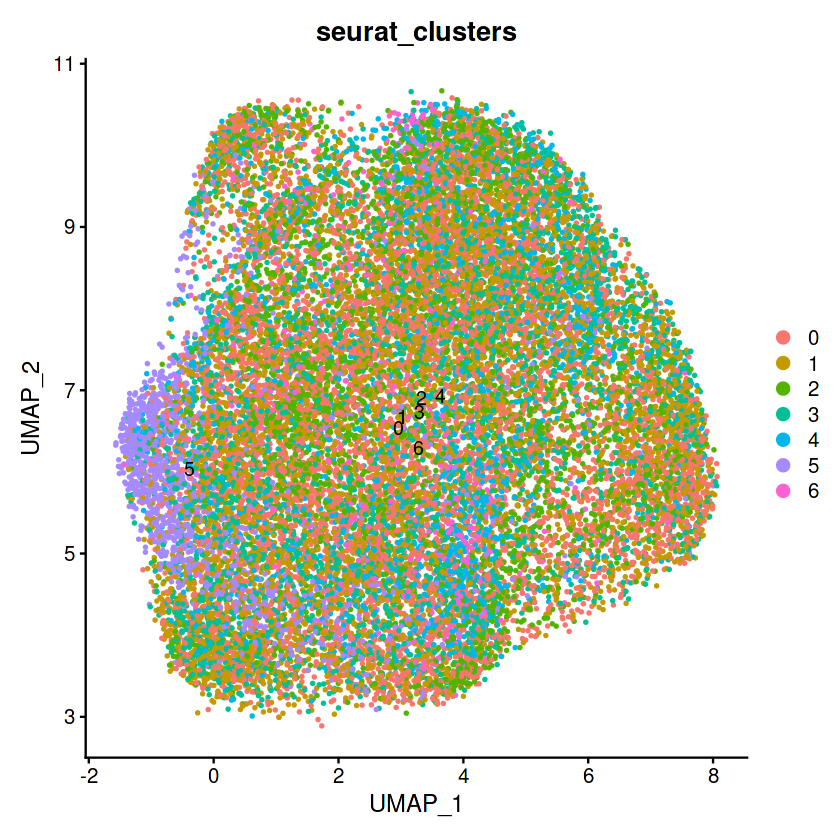

In [59]:
table(pbmc$orig.ident)
table(pbmc$seurat_clusters)
sum(table(pbmc$batch))
sum(table(pbmc$orig.ident))
sum(table(pbmc$seurat_clusters))
DimPlot(pbmc, reduction='umap',group.by='orig.ident', pt.size=0.5, label=TRUE) 
DimPlot(pbmc, reduction='umap',group.by='seurat_clusters', pt.size=0.5, label=TRUE) 


Layer3 Layer4 Layer5 Layer6     WM 
  7809   1124   2540   2341   1287 


   0    1    2    3    4    5 
3850 3553 2788 2343 1803  947 

[1] 15284

[1] 15101

[1] 15284

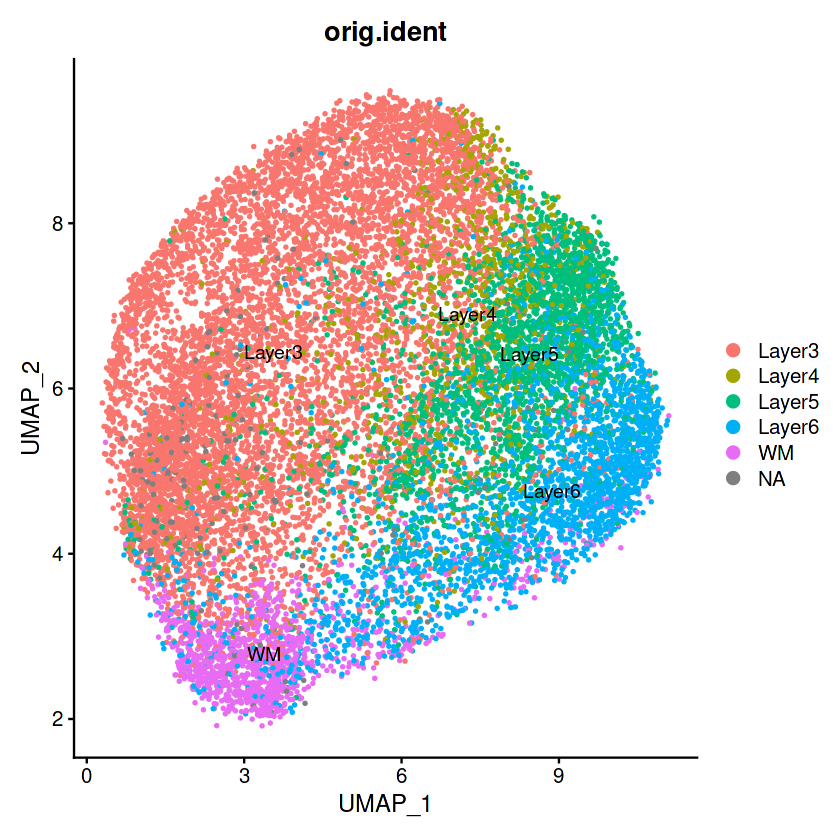

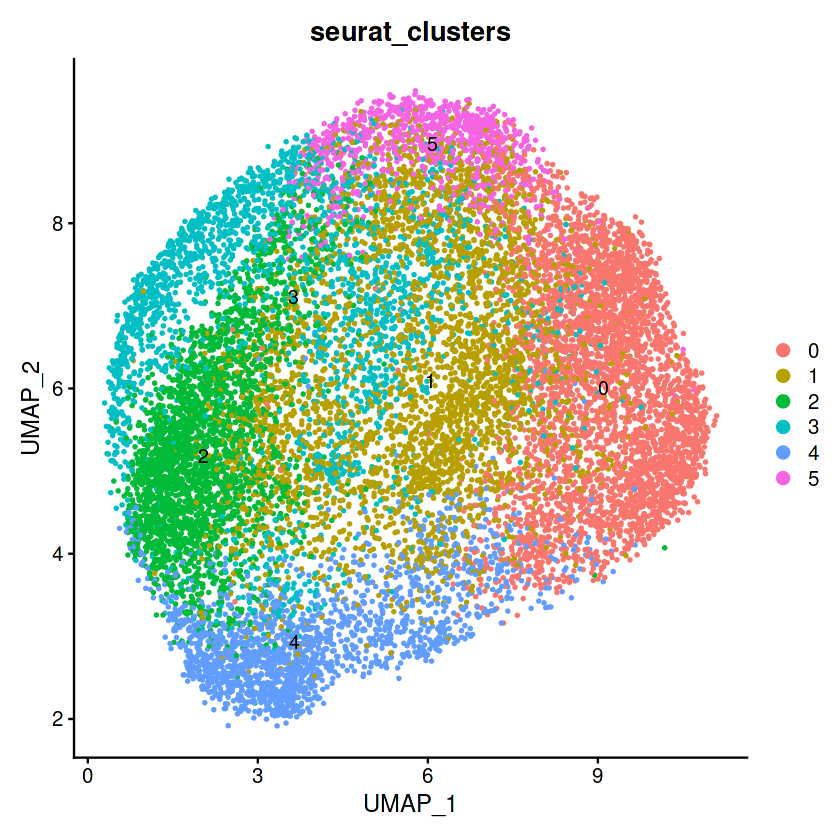

In [62]:
table(pbmc$orig.ident)
table(pbmc$seurat_clusters)
sum(table(pbmc$batch))
sum(table(pbmc$orig.ident))
sum(table(pbmc$seurat_clusters))
DimPlot(pbmc, reduction='umap',group.by='orig.ident', pt.size=0.5, label=TRUE) 
DimPlot(pbmc, reduction='umap',group.by='seurat_clusters', pt.size=0.5, label=TRUE) 

In [63]:
pbmc

An object of class Seurat 
67076 features across 15284 samples within 1 assay 
Active assay: RNA (67076 features, 6971 variable features)
 2 dimensional reductions calculated: pca, umap

In [135]:
D1_nona <- pbmc_nona_var[,pbmc_nona_var$batch=='D1']
D2_nona <- pbmc_nona_var[,pbmc_nona_var$batch=='D2']
D3_nona <- pbmc_nona_var[,pbmc_nona_var$batch=='D3']
D4_nona <- pbmc_nona_var[,pbmc_nona_var$batch=='D4']

------
default com3

In [136]:
score <- ARI(pbmc_nona_var$seurat_clusters,pbmc_nona_var$orig.ident)
print(c('combined ARI score: ', score))

[1] "combined ARI score: " "0.160745694742079"   


In [137]:
score <- ARI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 ARI score: ', score))

[1] "D1 ARI score: "    "0.162600344165307"


In [138]:
score <- ARI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 ARI score: ', score))

[1] "D2 ARI score: "    "0.174881791825169"


In [139]:
score <- ARI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 ARI score: ', score))

[1] "D3 ARI score: "    "0.178203103544071"


In [140]:
score_d4 <- ARI(D4_nona$seurat_clusters,D4_nona$orig.ident)
print(c('D4 ARI score: ', score_d4))

[1] "D4 ARI score: "    "0.144958425359559"


In [141]:
NMI_score <- NMI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 NMI score: ', NMI_score))

[1] "D1 NMI score: "    "0.291203074890806"


In [142]:
NMI_score <- NMI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 NMI score: ', NMI_score))

[1] "D2 NMI score: "    "0.293094463694408"


In [143]:
NMI_score <- NMI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 NMI score: ', NMI_score))

[1] "D3 NMI score: "    "0.304338364590924"


In [144]:
NMI_score_d4 <- NMI(D4_nona$seurat_clusters,D4_nona$orig.ident)
print(c('D4 NMI score: ', NMI_score_d4))

[1] "D4 NMI score: "    "0.273616532956494"


------
2ndset com3 GN 1000

In [64]:
score_all <- ARI(pbmc_nona_var$seurat_clusters,pbmc_nona_var$orig.ident)
print(c('combined ARI score: ', score_all))

[1] "combined ARI score: " "0.160745694742079"   


In [65]:
score_d1 <- ARI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 ARI score: ', score_d1))

[1] "D1 ARI score: "    "0.162600344165307"


In [66]:
score_d2 <- ARI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 ARI score: ', score_d2))

[1] "D2 ARI score: "    "0.174881791825169"


In [67]:
score_d3 <- ARI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 ARI score: ', score_d3))

[1] "D3 ARI score: "    "0.178203103544071"


In [68]:
score_d4 <- ARI(D4_nona$seurat_clusters,D4_nona$orig.ident)
print(c('D4 ARI score: ', score_d4))

[1] "D4 ARI score: "    "0.144958425359559"


In [69]:
NMI_score_d1 <- NMI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 NMI score: ', NMI_score_d1))

[1] "D1 NMI score: "    "0.291203074890806"


In [70]:
NMI_score_d2 <- NMI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 NMI score: ', NMI_score_d2))

[1] "D2 NMI score: "    "0.293094463694408"


In [71]:
NMI_score_d3 <- NMI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 NMI score: ', NMI_score_d3))

[1] "D3 NMI score: "    "0.304338364590924"


In [72]:
NMI_score_d4 <- NMI(D4_nona$seurat_clusters,D4_nona$orig.ident)
print(c('D4 NMI score: ', NMI_score_d4))

[1] "D4 NMI score: "    "0.273616532956494"


In [72]:
filename = '5thset_embed_all_com3all1500GN_unfil.txt'
# content_template = 'Combined ARI: %s\nD1 ARI: %s\nD2 ARI: %s\nD3 ARI: %s\nD4 ARI: %s\nD1 NMI: %s\nD2 NMI: %s\nD3 NMI: %s\nD4 NMI: %s'
content <- sprintf('Combined ARI: %s\nD1 ARI: %s\nD2 ARI: %s\nD3 ARI: %s\nD4 ARI: %s\nD1 NMI: %s\nD2 NMI: %s\nD3 NMI: %s\nD4 NMI: %s', score_all, score_d1, score_d2, score_d3, score_d4, NMI_score_d1, NMI_score_d2, NMI_score_d3, NMI_score_d4)
writeLines(content, filename)

In [73]:
jaccard <- function(a, b) {
    intersection = length(intersect(a, b))
    union = length(a) + length(b) - intersection
    return (intersection/union)
}

In [74]:
score <- jaccard(colnames(D3_nona[ ,D3_nona$orig.ident=='Layer1']),colnames(D3_nona[ ,D3_nona$seurat_clusters=='3']))
score

[1] 0.0235525

In [75]:
score <- jaccard(colnames(D3_nona[ ,D3_nona$orig.ident=='Layer2']),colnames(D3_nona[ ,D3_nona$seurat_clusters=='1']))
score

[1] 0.009816754

In [76]:
score <- jaccard(colnames(D3_nona[ ,D3_nona$orig.ident=='Layer3']),colnames(D3_nona[ ,D3_nona$seurat_clusters=='2']))
score

[1] 0.3319292

In [77]:
score <- jaccard(colnames(D3_nona[ ,D3_nona$orig.ident=='WM']),colnames(D3_nona[ ,D3_nona$seurat_clusters=='4']))
score

[1] 0

------
merged GN1000

In [68]:
score <- ARI(pbmc_nona_var$seurat_clusters,pbmc_nona_var$orig.ident)
print(c('combined ARI score: ', score))

[1] "combined ARI score: " "0.199769635683366"   


In [69]:
score <- ARI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 ARI score: ', score))

[1] "D1 ARI score: "    "0.239923579355561"


In [70]:
score <- ARI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 ARI score: ', score))

[1] "D2 ARI score: "    "0.190995295857583"


In [71]:
score <- ARI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 ARI score: ', score))

[1] "D3 ARI score: "    "0.340778068015402"


In [72]:
score <- ARI(D4_nona$seurat_clusters,D4_nona$orig.ident)
print(c('D4 ARI score: ', score))

[1] "D4 ARI score: "    "0.221004096744395"


In [73]:
score <- ARI(D5_nona$seurat_clusters,D5_nona$orig.ident)
print(c('D5 ARI score: ', score))

[1] "D5 ARI score: "    "0.232370991686013"


In [74]:
score <- ARI(D6_nona$seurat_clusters,D6_nona$orig.ident)
print(c('D6 ARI score: ', score))

[1] "D6 ARI score: "    "0.389979909753727"


--------BEFORE----------

In [ ]:
score <- ARI(pbmc_nona_var$seurat_clusters,pbmc_nona_var$orig.ident)
print(c('combined ARI score: ', score))

In [ ]:
score <- ARI(D1_nona$seurat_clusters,D1_nona$orig.ident)
print(c('D1 ARI score: ', score))

In [ ]:
score <- ARI(D2_nona$seurat_clusters,D2_nona$orig.ident)
print(c('D2 ARI score: ', score))

In [ ]:
score <- ARI(D3_nona$seurat_clusters,D3_nona$orig.ident)
print(c('D3 ARI score: ', score))

In [ ]:
pbmc

In [73]:
library(Seurat)
library(SeuratData)
library(SeuratDisk)
SaveH5Seurat(pbmc, filename = "240827_5thset_com3all1500GN_beer.h5Seurat")
Convert("240827_5thset_com3all1500GN_beer.h5Seurat", dest = "h5ad")

── Installed datasets ───────────────────────────────────────────────────────────────────────────────────────────────────────────── SeuratData v0.2.2 ──

✔ stxBrain 0.1.1                                                            


────────────────────────────────────────────────────────────────────────── Key ─────────────────────────────────────────────────────────────────────────

✔ Dataset loaded successfully
❯ Dataset built with a newer version of Seurat than installed
❓ Unknown version of Seurat installed


Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

Creating h5Seurat file for version 3.1.5.9900

Adding counts for RNA

Adding data for RNA

Adding scale.data for RNA

Adding variable features for RNA

No feature-level metadata found for RNA

Adding cell embeddings for pca

Adding loadings for pca

No projected loadings for pca

Adding standard deviations for pca

No JackStraw data for pca

Adding cell embeddings for umap


<h2>Integrated w/ spatial w/ Batch Effect Removal Visualization</h2>

### Helper Functions:
1. Download Image Data
   * Downloads the image, scalefactors, and the tissue positions. See Fetch_Data.ipynb.
2. Add Image Data to Seurat Object.
   * Add an image to a Seurat Object.
   * Create a Spatial assay for the seurat object first before attaching the image.
3. SpatiallyVariableFeatures_workaround
   * Current implementation of SpatiallyVariableFeatures does not work. See https://github.com/satijalab/seurat/issues/7034
   * Only to be used if necessary for downstream analysis.

In [ ]:
# Function for attaching image to Seurat Object
addImage <- function(object, sample_id, path, new_name=NULL) {
    image_dir <- file.path(path, sample_id)
    img <- Seurat::Read10X_Image(image.dir = image_dir)
    Seurat::DefaultAssay(object = img) <- 'Spatial'
    img <- img[colnames(x = object)]
    if (is.null(new_name)) {
        object[['image']] <- img
    } else {
        print(new_name)
        object[[new_name]] <- img
    }
    return(object)
}

In [ ]:
# Using a workaround for now - https://github.com/satijalab/seurat/issues/7422
SpatiallyVariableFeatures_workaround <- function(object, assay="SCT", selection.method = "moransi") {
  #' This is work around function to replace SeuratObject::SpatiallyVariableFeatures function.
  #' return ranked list of Spatially Variable Features
  
  # Check if object is a Seurat object
  if (!inherits(object, "Seurat")) {
    stop("object must be a Seurat object")
  }

  # Check if assay is a valid assay
  if (!assay %in% names(object@assays)) {
    stop("assay must be a valid assay")
  }
  
  # Extract meta.features from the specified object and assay
  data <- object@assays[[assay]]@meta.features
  
  # Select columns starting with the provided col_prefix
  moransi_cols <- grep(paste0("^", selection.method), colnames(data), value = TRUE)

  # Filter rows where "moransi.spatially.variable" is TRUE
  filtered_data <- data[data[[paste0(selection.method, ".spatially.variable")]], moransi_cols]

  # Sort filtered data by "moransi.spatially.variable.rank" column in ascending order
  sorted_data <- filtered_data[order(filtered_data[[paste0(selection.method, ".spatially.variable.rank")]]), ]
    
  # Return row names of the sorted data frame
  rownames(sorted_data)
}

In [ ]:
D1_corrected <- pbmc_nona_var[,pbmc_nona_var$batch=='D1']
D2_corrected <- pbmc_nona_var[,pbmc_nona_var$batch=='D2']
D3_corrected <- pbmc_nona_var[,pbmc_nona_var$batch=='D3']

In [ ]:
removeColnameSuffix <- function(colname) {
    if (endsWith(colname, ".1") || endsWith(colname, ".2")) {
        return(gsub('.{2}$', '', colname))
    }
    return(colname)
}

In [ ]:
new_D1_colnames <- lapply(colnames(D1_corrected), removeColnameSuffix)
new_D1_colnames <- simplify2array(new_D1_colnames)
D1_corrected <- RenameCells(D1_corrected, new.names = new_D1_colnames)
# colnames(D1_corrected) <- new_D1_colnames

In [ ]:
new_D2_colnames <- lapply(colnames(D2_corrected), removeColnameSuffix)
new_D2_colnames <- simplify2array(new_D2_colnames)
D2_corrected <- RenameCells(D2_corrected, new.names = new_D2_colnames)

In [ ]:
new_D3_colnames <- lapply(colnames(D3_corrected), removeColnameSuffix)
new_D3_colnames <- simplify2array(new_D3_colnames)
D3_corrected <- RenameCells(D3_corrected, new.names = new_D3_colnames)

In [ ]:
D1_corrected_spatial_assay <- CreateAssayObject(counts = D1_corrected[["RNA"]]@data)
D1_corrected[["Spatial"]] <- D1_corrected_spatial_assay
D2_corrected_spatial_assay <- CreateAssayObject(counts = D2_corrected[["RNA"]]@data)
D2_corrected[["Spatial"]] <- D2_corrected_spatial_assay
D3_corrected_spatial_assay <- CreateAssayObject(counts = D3_corrected[["RNA"]]@data)
D3_corrected[["Spatial"]] <- D3_corrected_spatial_assay

In [ ]:
# Set the download dir to the directory where the image information of the samples are downloaded. "dataset/samples"
data_dir <- 'dataset'
sample_dir <- 'samples'
download_dir <- file.path(data_dir, sample_dir)

In [ ]:
sample_674_name <- '151674'
D1_corrected <- addImage(D1_corrected, sample_674_name, download_dir, new_name=glue("image{sample_674_name}"))
sample_675_name <- '151675'
D2_corrected <- addImage(D2_corrected, sample_675_name, download_dir, new_name=glue("image{sample_675_name}"))
sample_674_name <- '151674'
D3_corrected <- addImage(D3_corrected, sample_674_name, download_dir, new_name=glue("image{sample_674_name}"))

In [ ]:
DefaultAssay(D1_corrected) <- "Spatial"
DefaultAssay(D2_corrected) <- "Spatial"
DefaultAssay(D3_corrected) <- "Spatial"

In [ ]:
D1_corrected
D2_corrected
D3_corrected

In [ ]:
D1_corrected
D2_corrected
D3_corrected

In [ ]:
# Adjust plot size
options(repr.plot.width = 30, repr.plot.height = 10)

In [ ]:
D1_corrected_plot_ncount <- SpatialFeaturePlot(D1_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D1_corrected_plot_layers <- SpatialDimPlot(D1_corrected, group.by='orig.ident', label = TRUE, label.size = 9) + theme(legend.position = "right")
D1_corrected_plot_seurat <- SpatialDimPlot(D1_corrected, group.by='seurat_clusters', label = TRUE, label.size = 9) + theme(legend.position = "right")
wrap_plots(D1_corrected_plot_ncount, D1_corrected_plot_layers, D1_corrected_plot_seurat)

In [ ]:
g <- ggplot_build(D1_corrected_plot_layers)
cols <- unique(g$data[[1]]["fill"])
barplot(c(5,5,5,5,5,5,5), col = c(cols[1,1], cols[2,1], cols[3,1], cols[4,1], cols[5,1], cols[6,1], cols[7,1] ))

In [ ]:
layers_col <- c('WM'=cols[3,1], 'Layer1'=cols[1,1] ,'Layer2'=cols[6,1], 'Layer3'=cols[2,1], 'Layer4'=cols[7,1], 'Layer5'=cols[5,1], 'Layer6'=cols[4,1])
colors_674 <- c('4'=cols[3,1], '3'=cols[1,1], '6'=cols[6,1], '2'=cols[2,1], '0'=cols[7,1], '1'=cols[5,1], '5'=cols[4,1])
colors_675 <- c('5'=cols[3,1], '3'=cols[1,1], '2'=cols[6,1], '0'=cols[2,1], '6'=cols[7,1], '1'=cols[5,1], '4'=cols[4,1])
colors_674 <- c('4'=cols[3,1], '3'=cols[1,1], '5'=cols[6,1], '2'=cols[2,1], '6'=cols[7,1], '1'=cols[5,1], '0'=cols[4,1]) 

In [ ]:
layers_col <- c('WM'=cols[3,1], 'Layer1'=cols[1,1] ,'Layer2'=cols[6,1], 'Layer3'=cols[2,1], 'Layer4'=cols[7,1], 'Layer5'=cols[5,1], 'Layer6'=cols[4,1])
b_colors_674 <- c('5'=cols[3,1], '4'=cols[1,1] ,'3'=cols[6,1], '1'=cols[2,1], '2'=cols[7,1], '0'=cols[5,1], '6'=cols[4,1])
b_colors_675 <- c('6'=cols[3,1], '4'=cols[1,1] ,'5'=cols[6,1], '1'=cols[2,1], '3'=cols[7,1], '2'=cols[5,1], '0'=cols[4,1])
b_colors_674 <- c('5'=cols[3,1], '4'=cols[1,1] ,'3'=cols[6,1], '1'=cols[2,1], '6'=cols[7,1], '0'=cols[5,1], '2'=cols[4,1]) 

In [ ]:
to_test <- colnames(D3_nona[ ,D3_nona$orig.ident=="Layer1"])
for (i in unique(D3_nona$seurat_clusters)){
score <- jaccard(to_test, colnames(D3_nona[ ,D3_nona$seurat_clusters==i]))
print(paste0(i, " - ",score))
}

In [ ]:
to_test <- colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$orig.ident=="Layer4"])
for (i in unique(D3_nospatial_nocorrection$seurat_clusters)){
score <- jaccard(to_test, colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$seurat_clusters==i]))
print(paste0(i, " - ",score))
}

In [ ]:
to_test <- colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$seurat_clusters=='6'])
for (i in unique(D3_nospatial_nocorrection$orig.ident)){
score <- jaccard(colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$orig.ident==i]), to_test)
print(paste0(i, " - ",score))
}

In [ ]:
D3_corrected_plot_ncount <- SpatialFeaturePlot(D3_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D3_corrected_plot_layers <- SpatialDimPlot(D3_corrected, group.by='orig.ident', label = TRUE, label.size = 7, image.alpha=0.3) + theme(legend.position = "right") + scale_fill_manual(values = layers_col)
D3_corrected_plot_seurat <- SpatialDimPlot(D3_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7, image.alpha=0.3) + theme(legend.position = "right") + scale_fill_manual(values = colors_674)
wrap_plots(D3_corrected_plot_ncount, D3_corrected_plot_layers, D3_corrected_plot_seurat)

In [ ]:
# ggsave('Clustering_675_nolabel.png',D2_corrected_plot_seurat)

In [ ]:
D1_corrected_plot_ncount <- SpatialFeaturePlot(D1_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D1_corrected_plot_layers <- SpatialDimPlot(D1_corrected, group.by='orig.ident', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = layers_col)
D1_corrected_plot_seurat <- SpatialDimPlot(D1_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = colors_674)
wrap_plots(D1_corrected_plot_ncount, D1_corrected_plot_layers, D1_corrected_plot_seurat)

In [ ]:
D1_corrected_plot_ncount <- SpatialFeaturePlot(D1_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D1_corrected_plot_layers <- SpatialDimPlot(D1_corrected, group.by='orig.ident', label = TRUE, label.size = 7) + theme(legend.position = "right")
D1_corrected_plot_seurat <- SpatialDimPlot(D1_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right")
wrap_plots(D1_corrected_plot_ncount, D1_corrected_plot_layers, D1_corrected_plot_seurat)

In [ ]:
D2_corrected_plot_ncount <- SpatialFeaturePlot(D2_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D2_corrected_plot_layers <- SpatialDimPlot(D2_corrected, group.by='orig.ident', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = layers_col)
D2_corrected_plot_seurat <- SpatialDimPlot(D2_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = colors_675)
wrap_plots(D2_corrected_plot_ncount, D2_corrected_plot_layers, D2_corrected_plot_seurat)

In [ ]:
D2_corrected_plot_ncount <- SpatialFeaturePlot(D2_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D2_corrected_plot_layers <- SpatialDimPlot(D2_corrected, group.by='orig.ident', label = TRUE, label.size = 7) + theme(legend.position = "right")
D2_corrected_plot_seurat <- SpatialDimPlot(D2_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right")
wrap_plots(D2_corrected_plot_ncount, D2_corrected_plot_layers, D2_corrected_plot_seurat)

In [ ]:
D3_corrected_plot_ncount <- SpatialFeaturePlot(D3_corrected, features = "nCount_Spatial") + theme(legend.position = "right")
D3_corrected_plot_layers <- SpatialDimPlot(D3_corrected, group.by='orig.ident', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = layers_col)
D3_corrected_plot_seurat <- SpatialDimPlot(D3_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = colors_674)
wrap_plots(D3_corrected_plot_ncount, D3_corrected_plot_layers, D3_corrected_plot_seurat)

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 10)
subset_plot_1 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 4],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674)
subset_plot_2 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 3],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674)
subset_plot_3 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 2],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674)
wrap_plots(subset_plot_1, subset_plot_2, subset_plot_3) 

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 10)
subset_plot_1 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "WM"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 7, image.alpha = 0.3) + scale_fill_manual(values = layers_col)
subset_plot_2 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer1"],crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 7, image.alpha = 0.3) + scale_fill_manual(values = layers_col)
subset_plot_3 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer3"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 7, image.alpha = 0.3) + scale_fill_manual(values = layers_col)
wrap_plots(subset_plot_1, subset_plot_2, subset_plot_3) 

In [ ]:
D3_corrected_plot_ncount <- SpatialFeaturePlot(D3_corrected, features = "nCount_Spatial", image = NULL) + theme(legend.position = "right")
D3_corrected_plot_layers <- SpatialDimPlot(D3_corrected, group.by='orig.ident', label = TRUE, label.size = 7) + theme(legend.position = "right")
D3_corrected_plot_seurat <- SpatialDimPlot(D3_corrected, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right")
wrap_plots(D3_corrected_plot_ncount, D3_corrected_plot_layers, D3_corrected_plot_seurat)

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 20)
gene1 <- SpatialFeaturePlot(D3_corrected, features = "nCount_Spatial") + theme(legend.position = "right", legend.key.size = unit(2,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene2 <- SpatialFeaturePlot(D3_corrected, features = "nCount_RNA") + theme(legend.position = "right", legend.key.size = unit(2,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene3 <- SpatialFeaturePlot(D3_corrected, features = "nFeature_Spatial") + theme(legend.position = "right", legend.key.size = unit(2,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene4 <- SpatialFeaturePlot(D3_corrected, features = "nFeature_RNA") + theme(legend.position = "right", legend.key.size = unit(2,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
wrap_plots(gene1, gene2, gene3, gene4)
# ENSG00000243485

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 20)
gene1 <- SpatialFeaturePlot(D3_corrected, features = "ENSG00000101439") + theme(legend.position = "right", legend.key.size = unit(1.5,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene2 <- SpatialFeaturePlot(D3_corrected, features = "ENSG00000087250") + theme(legend.position = "right", legend.key.size = unit(1.5,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene3 <- SpatialFeaturePlot(D3_corrected, features = "ENSG00000120885") + theme(legend.position = "right", legend.key.size = unit(1.5,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene4 <- SpatialFeaturePlot(D3_corrected, features = "ENSG00000198763") + theme(legend.position = "right", legend.key.size = unit(1.5,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene5 <- SpatialFeaturePlot(D3_corrected, features = "ENSG00000198888") + theme(legend.position = "right", legend.key.size = unit(1.5,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))
gene6 <- SpatialFeaturePlot(D3_corrected, features = "ENSG00000198899") + theme(legend.position = "right", legend.key.size = unit(1.5,'cm'), legend.title = element_text(size=14), legend.text = element_text(size=12))

wrap_plots(gene1, gene2, gene3, gene4, gene5, gene6)
# ENSG00000243485

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 20)
wrap_plots(D1_corrected_plot_layers, D2_corrected_plot_layers, D3_corrected_plot_layers, D1_corrected_plot_seurat, D2_corrected_plot_seurat, D3_corrected_plot_seurat, ncol=3, nrow=2)

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 20)
wrap_plots(D1_corrected_plot_layers, D2_corrected_plot_layers, D3_corrected_plot_layers, D1_corrected_plot_seurat, D2_corrected_plot_seurat, D3_corrected_plot_seurat, ncol=3, nrow=2)

In [ ]:
dlfpc.merge <- merge(D1_corrected, D2_corrected)
dlfpc.merge <- merge(dlfpc.merge, D3_corrected)

In [ ]:
pbmc_nona_var@reductions$umap

In [ ]:
dlfpc.merge@reductions

In [ ]:
DefaultAssay(dlfpc.merge) <- "Spatial"

In [ ]:
legend_theme <- theme(legend.title = element_text(size=30), legend.text = element_text(size=20))

In [ ]:
D1_orig <- SpatialDimPlot(dlfpc.merge, label.size=4, images="image_151674", group.by="orig.ident")
D2_orig <- SpatialDimPlot(dlfpc.merge, images="image_151675", group.by="orig.ident")
D3_orig <- SpatialDimPlot(dlfpc.merge, images="image_151674", group.by="orig.ident")
D1_seurat <- SpatialDimPlot(dlfpc.merge, images="image_151674", group.by="seurat_clusters")
D2_seurat <- SpatialDimPlot(dlfpc.merge, images="image_151675", group.by="seurat_clusters")
D3_seurat <- SpatialDimPlot(dlfpc.merge, images="image_151674", group.by="seurat_clusters")

In [ ]:
options(repr.plot.width = 21, repr.plot.height = 14)
wrap_plots(D1_orig, D2_orig, D3_orig, D1_seurat, D2_seurat, D3_seurat, ncol=3)
options(repr.plot.width = 7, repr.plot.height = 7)

In [ ]:
output_dir <- "output"
output_default_nocorr_rna <- "default_nocorr_rna"
output_default_nocorr_sct <- "default_nocorr_sct"
output_spatial_rna <- "spatial_nocorr_rna"
output_spatial_sct <- "spatial_nocorr_sct"
output_default_corrected <- "default_corrected"
output_spatial_corrected <- "spatial_corrected"
output_orig <- "orig"
output_D1 <- "D1_single"
output_D2 <- "D2_single"
output_D3 <- "D3_single"
output_subdirs <- list(output_default_nocorr_rna, output_default_nocorr_sct, 
                    output_spatial_rna, output_spatial_sct, 
                    output_default_corrected, output_spatial_corrected,
                    output_D1, output_D2, output_D3,
                    output_orig)
download_dir <- file.path(data_dir, sample_dir)
if (!file.exists(output_dir)) {
    dir.create(output_dir)
}

for (subdir in output_subdirs) {
    subdir_path <- file.path(output_dir,subdir)
    if (!file.exists(subdir_path)) {
        dir.create(subdir_path)    
    }
}

In [ ]:
orig_path <- file.path(output_dir, output_orig)

jpeg(filename = file.path(orig_path, glue("{output_orig}_151674.jpg")), height = 400, width = 470, quality = 100)
D1_orig
dev.off()
jpeg(filename = file.path(orig_path, glue("{output_orig}_151675.jpg")), height = 400, width = 470, quality = 100)
D2_orig
dev.off()
jpeg(filename = file.path(orig_path, glue("{output_orig}_151674.jpg")), height = 400, width = 470, quality = 100)
D3_orig
dev.off()

In [ ]:
gsi_path <- file.path(output_dir, output_spatial_corrected)

jpeg(filename = file.path(gsi_path, glue("{output_spatial_corrected}_151674.jpg")), height = 400, width = 500, quality = 100)
D1_seurat
dev.off()
jpeg(filename = file.path(gsi_path, glue("{output_spatial_corrected}_151675.jpg")), height = 400, width = 500, quality = 100)
D2_seurat
dev.off()
jpeg(filename = file.path(gsi_path, glue("{output_spatial_corrected}_151674.jpg")), height = 400, width = 500, quality = 100)
D3_seurat
dev.off()

In [ ]:
options(repr.plot.width = 21, repr.plot.height = 7)
SpatialDimPlot(dlfpc.merge, group.by="seurat_clusters")

In [ ]:
length(rownames(dlfpc.merge[["image_151674"]]@coordinates))

<h2>End of Integrated w/ spatial w/ Batch Effect Removal Visualization</h2>

<h2>Integrated w/o spatial info w/o BE Removal (ADDED HARMONY BE REMOVAL)</h2>
(No integrated spatial information, no batch effect removal)

Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000171617 
Negative:  ENSG00000168314 



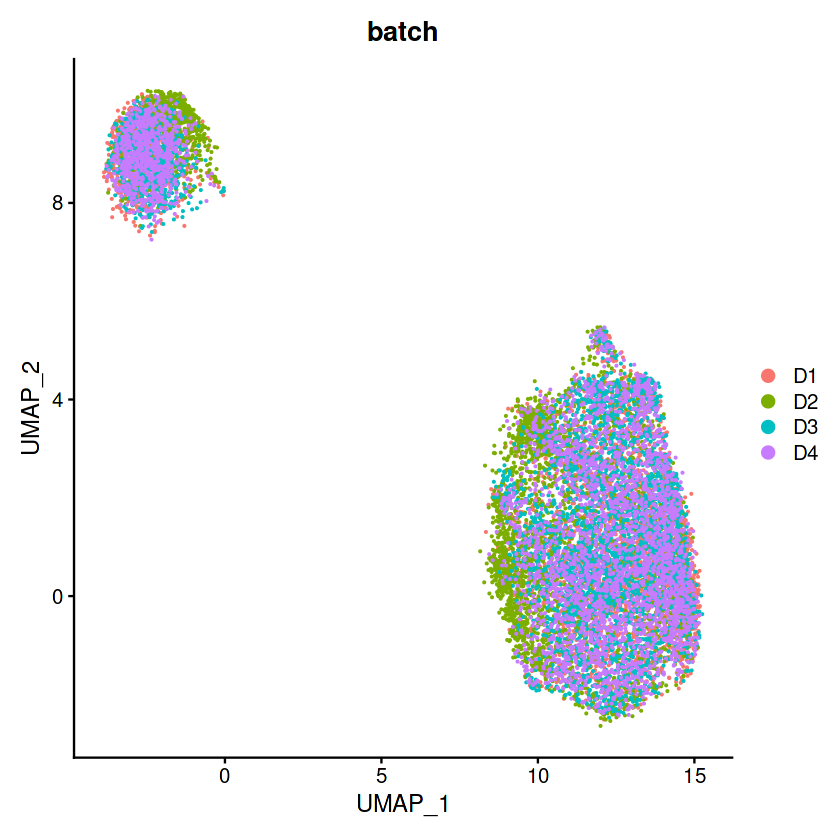

In [73]:
pbmc_batch=CreateSeuratObject(counts = DATA_default, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 2000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [74]:
pbmc_batch <- RunHarmony(pbmc_batch, 'batch')

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony converged after 2 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”


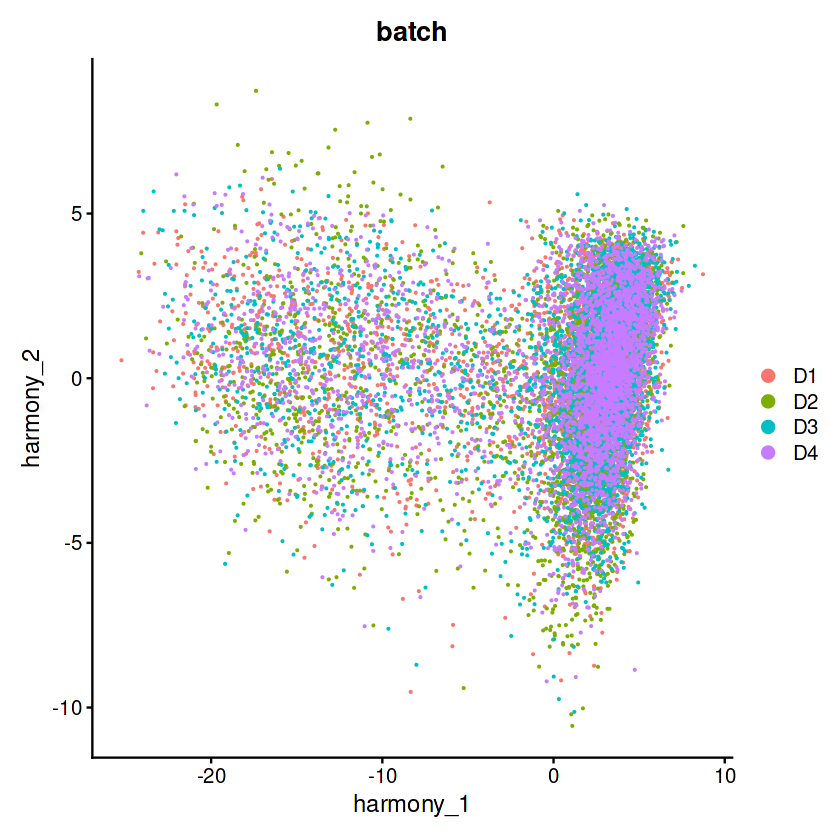

In [75]:
# pbmc_batch <- RunUMAP(pbmc_batch, reduction="harmony")
DimPlot(pbmc_batch, reduction='harmony', group.by='batch', pt.size=0.1) 

In [76]:
pbmc_batch <- FindNeighbors(object = pbmc_batch, reduction='harmony')
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 419791

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8236
Number of communities: 8
Elapsed time: 1 seconds


In [77]:
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.485)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 419791

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8242
Number of communities: 7
Elapsed time: 1 seconds


In [50]:
plot1 <- DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1)
plot2 <- DimPlot(pbmc_batch, reduction='umap', group.by='seurat_clusters', pt.size=0.1) 

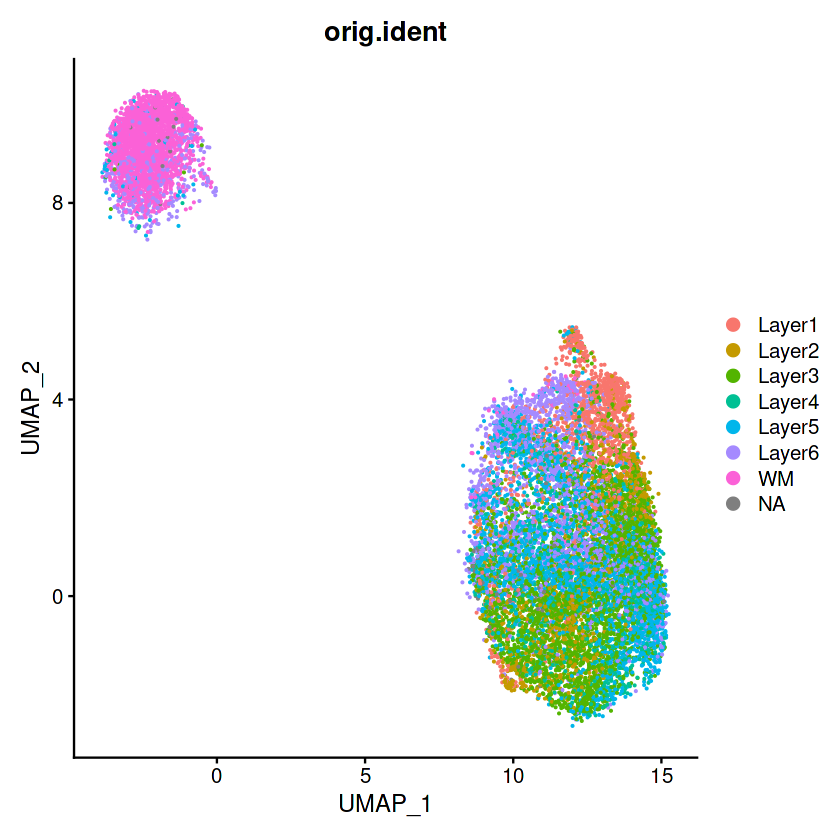

In [51]:
plot1

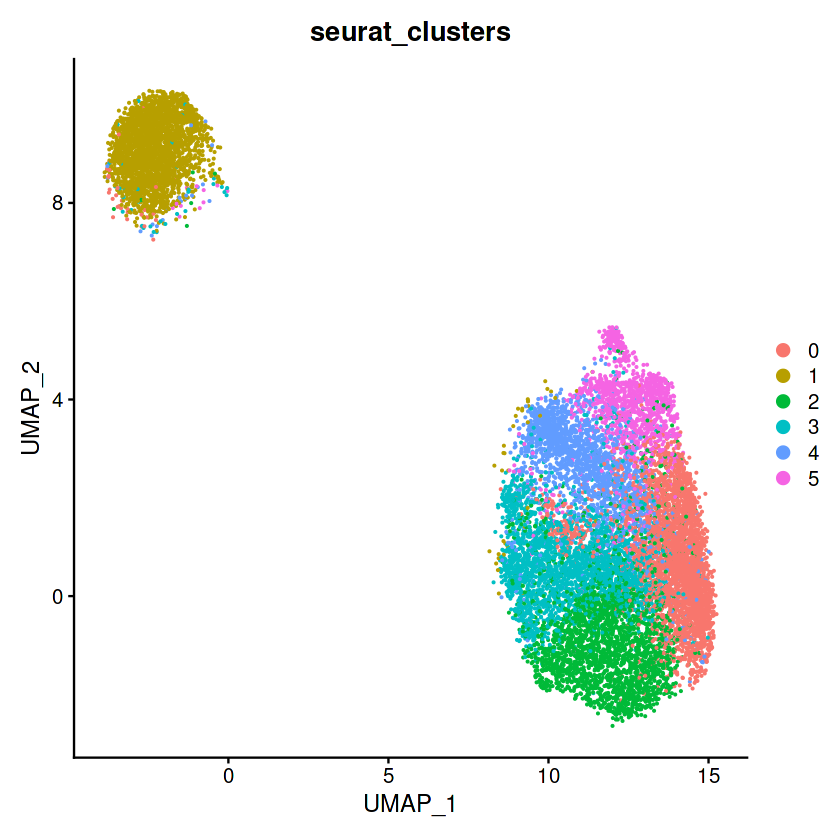

In [52]:
plot2

In [78]:
plot3 <- DimPlot(pbmc_batch, reduction='harmony', group.by='orig.ident', pt.size=0.1)
plot4 <- DimPlot(pbmc_batch, reduction='harmony', group.by='seurat_clusters', pt.size=0.1) 

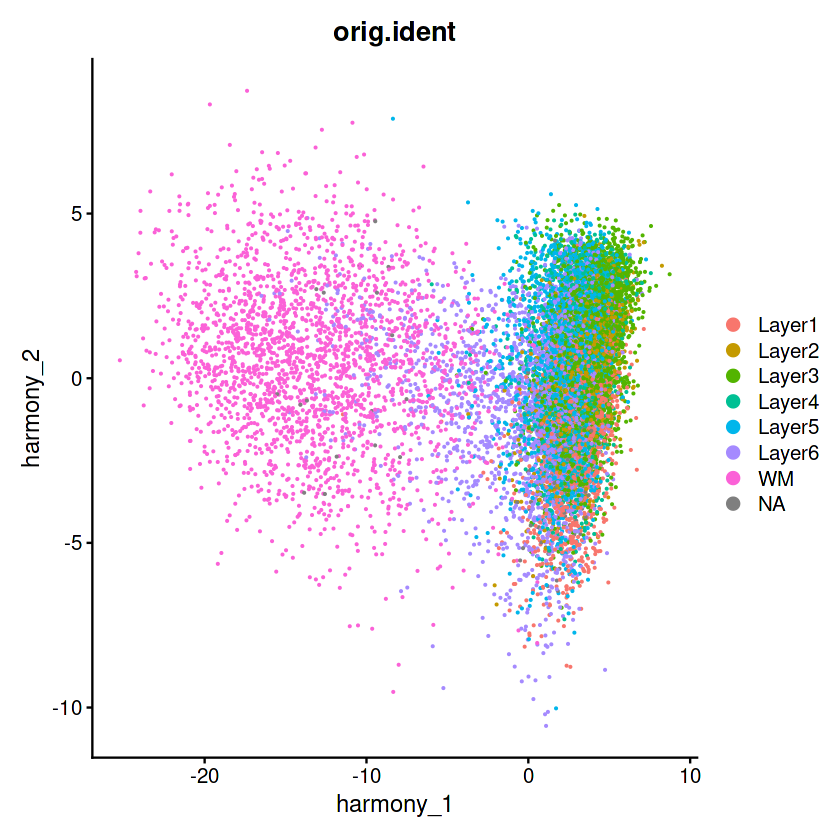

In [79]:
plot3

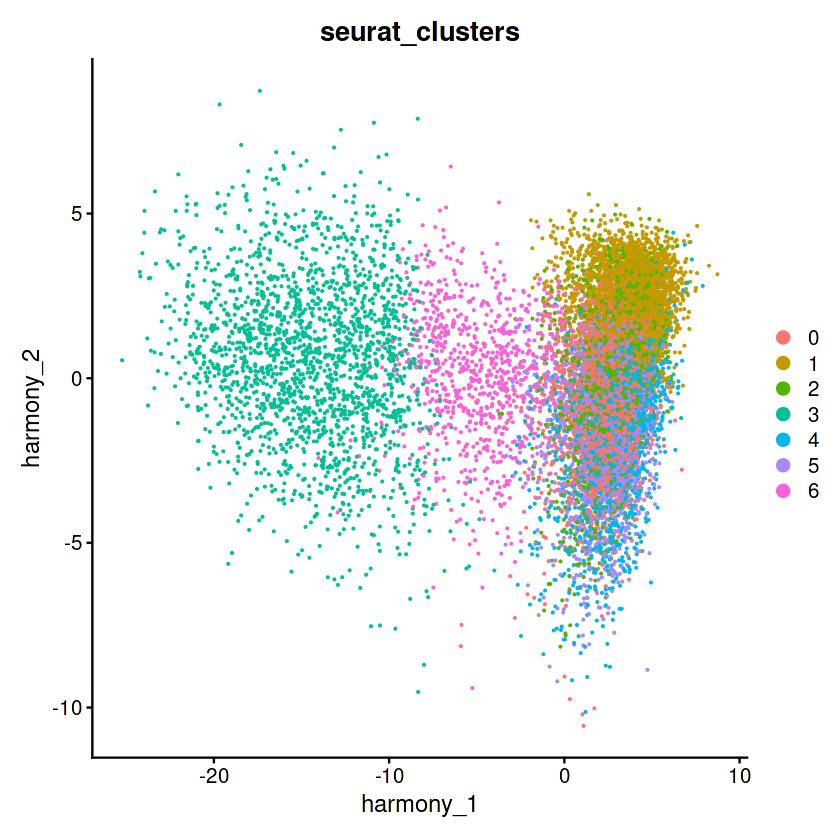

In [80]:
plot4

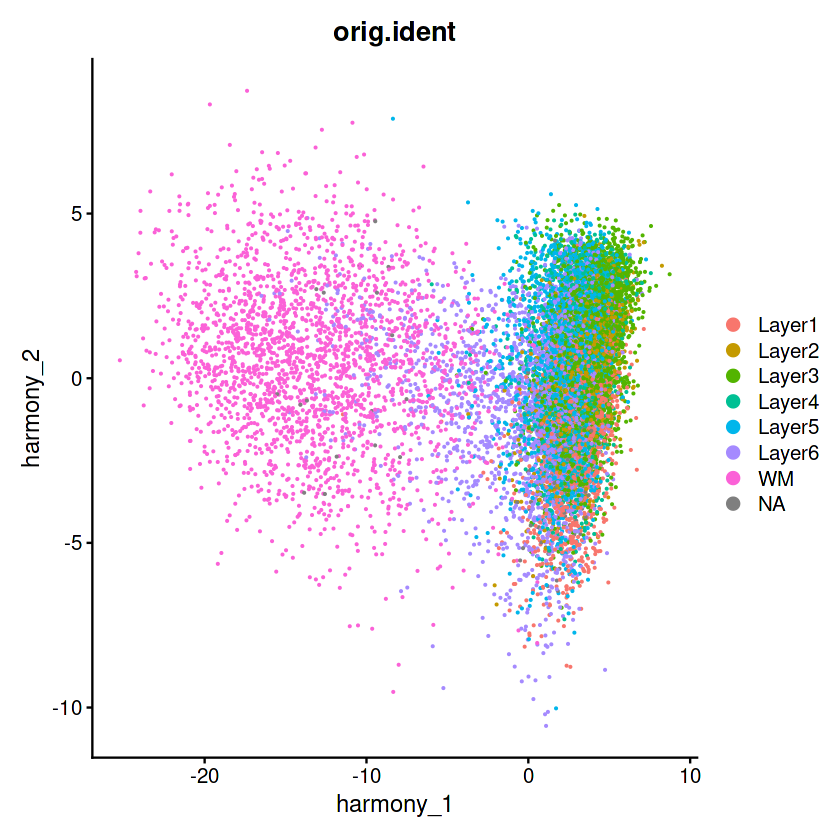

In [63]:
plot3

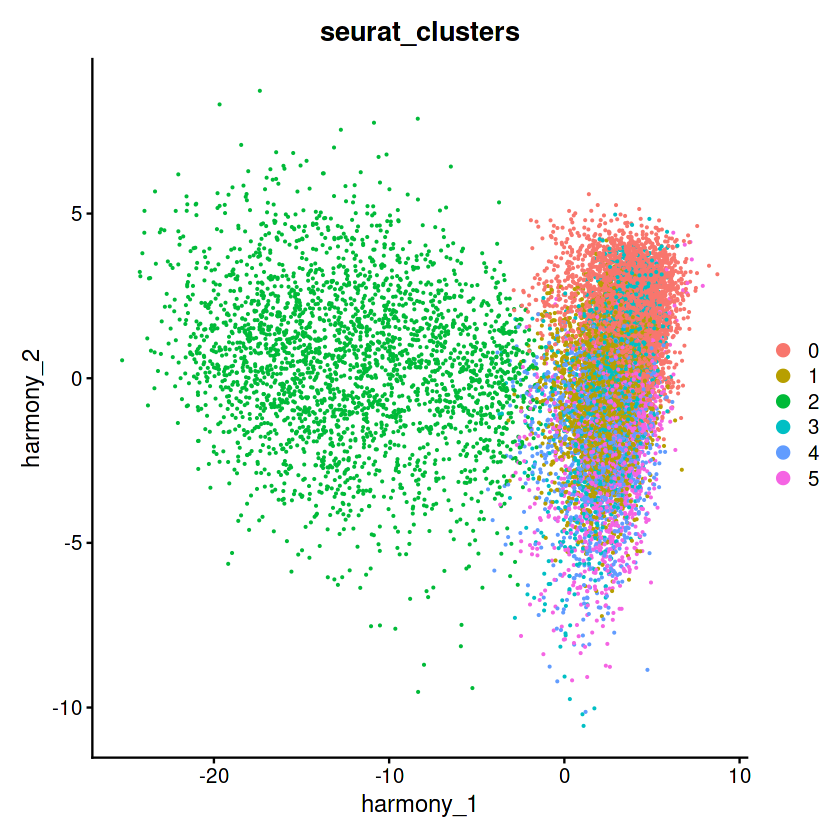

In [64]:
plot4

In [24]:
clusters1 <- pbmc_batch$seurat_clusters

In [45]:
clusters2 <- pbmc_batch$seurat_clusters

In [26]:
values1 <- unlist(clusters1)

In [46]:
values2 <- unlist(clusters2)

In [27]:
length(values1)

[1] 14364

In [47]:
are_values_equal <- all(values1==values2)
are_values_equal

[1] TRUE

In [48]:
unequal_values <- values1 != values2

if (any(unequal_values)){
    print(data.frame(Key = names(values1)[unequal_values], dict1_value = values1[unequal_values], dict2_values = values2[unequal_values]))
} else{
    print('all equal')
}

[1] "all equal"


In [81]:
listings = pbmc_batch@meta.data[['batch']]
numbered_list <- as.integer(factor(listings, levels = unique(listings)))
batch_numeric <- numbered_list
names(batch_numeric) <- colnames(x=pbmc_batch)
pbmc_batch<- AddMetaData(
    object = pbmc_batch,
    metadata = batch_numeric,
    col.name = 'batch_numeric'
    )
# head(x=pbmc)

In [82]:
listings = pbmc_batch@meta.data[['orig.ident']]
numbered_list <- as.integer(factor(listings, levels = unique(listings)))
ident_numeric <- numbered_list
names(ident_numeric) <- colnames(x=pbmc_batch)
pbmc_batch<- AddMetaData(
    object = pbmc_batch,
    metadata = ident_numeric,
    col.name = 'ident_numeric'
    )
# head(x=pbmc)

In [83]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
33538 features across 14243 samples within 1 assay 
Active assay: RNA (33538 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, harmony

In [84]:
D1_nona_batch <- nona_batch[,nona_batch$batch=='D1']
D2_nona_batch <- nona_batch[,nona_batch$batch=='D2']
D3_nona_batch <- nona_batch[,nona_batch$batch=='D3']
D4_nona_batch <- nona_batch[,nona_batch$batch=='D4']

In [85]:
sil_obj <- silhouette_seurat(pbmc_batch,"seurat_clusters",PCUSE)
silhouette_mean(sil_obj)

[1] 0.04342124

In [86]:
sil_obj <- silhouette_seurat(pbmc_batch,"batch_numeric",PCUSE)
silhouette_mean(sil_obj)

[1] -0.008609727

In [87]:
sil_obj <- silhouette_seurat(nona_batch,"ident_numeric",PCUSE)
silhouette_mean(sil_obj)

[1] 0.005084114

<h2>No Harmony</h2>

In [40]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.255311052746803"                               


In [41]:
score <- ARI(D1_nona_batch$seurat_clusters, D1_nona_batch$orig.ident)
print(c('before batch effect removal D1 ARI score: ', score))

[1] "before batch effect removal D1 ARI score: "
[2] "0.239126187394325"                         


In [42]:
score <- ARI(D2_nona_batch$seurat_clusters, D2_nona_batch$orig.ident)
print(c('before batch effect removal D2 ARI score: ', score))

[1] "before batch effect removal D2 ARI score: "
[2] "0.246066850528572"                         


In [43]:
score <- ARI(D3_nona_batch$seurat_clusters, D3_nona_batch$orig.ident)
print(c('before batch effect removal D3 ARI score: ', score))

[1] "before batch effect removal D3 ARI score: "
[2] "0.295285953634499"                         


In [63]:
score <- ARI(D4_nona_batch$seurat_clusters, D4_nona_batch$orig.ident)
print(c('before batch effect removal D4 ARI score: ', score))

[1] "before batch effect removal D4 ARI score: "
[2] "0.226351367479408"                         


<h2>harmony ---------------

In [88]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.22537579928918"                                


In [89]:
score <- ARI(D1_nona_batch$seurat_clusters, D1_nona_batch$orig.ident)
print(c('before batch effect removal D1 ARI score: ', score))

[1] "before batch effect removal D1 ARI score: "
[2] "0.222204989777553"                         


In [90]:
score <- ARI(D2_nona_batch$seurat_clusters, D2_nona_batch$orig.ident)
print(c('before batch effect removal D2 ARI score: ', score))

[1] "before batch effect removal D2 ARI score: "
[2] "0.244171378788704"                         


In [91]:
score <- ARI(D3_nona_batch$seurat_clusters, D3_nona_batch$orig.ident)
print(c('before batch effect removal D3 ARI score: ', score))

[1] "before batch effect removal D3 ARI score: "
[2] "0.226285108613653"                         


In [92]:
score <- ARI(D4_nona_batch$seurat_clusters, D4_nona_batch$orig.ident)
print(c('before batch effect removal D4 ARI score: ', score))

[1] "before batch effect removal D4 ARI score: "
[2] "0.218183582524831"                         


In [95]:
NMI_score_d1 <- NMI(D1_nona_batch$seurat_clusters,D1_nona_batch$orig.ident)
print(c('D1 NMI score: ', NMI_score_d1))

[1] "D1 NMI score: "    "0.333728762550319"


In [96]:
NMI_score_d2 <- NMI(D2_nona_batch$seurat_clusters,D2_nona_batch$orig.ident)
print(c('D2 NMI score: ', NMI_score_d2))

[1] "D2 NMI score: "    "0.338383791560361"


In [97]:
NMI_score_d3 <- NMI(D3_nona_batch$seurat_clusters,D3_nona_batch$orig.ident)
print(c('D3 NMI score: ', NMI_score_d3))

[1] "D3 NMI score: "    "0.325914753887434"


In [98]:
NMI_score_d4 <- NMI(D4_nona_batch$seurat_clusters,D4_nona_batch$orig.ident)
print(c('D4 NMI score: ', NMI_score_d4))

[1] "D4 NMI score: "    "0.315547378504188"


In [ ]:
default_integrated_markers <- FindAllMarkers(object = pbmc_batch, logfc.threshold=0.1)
head(default_integrated_markers)

In [ ]:
# default thres
table(default_integrated_markers$cluster)
sum(table(default_integrated_markers$cluster))

In [ ]:
# 0.1 thres
table(default_integrated_markers$cluster)
sum(table(default_integrated_markers$cluster))

In [ ]:
write.csv(default_integrated_markers,'no_spatial_no_ber_01_threshold.csv')

<h2>Integrated w/ spatial info w/ Harmony BE Removal</h2>
(No integrated spatial information, no batch effect removal)

Warning message:
“Non-unique cell names (colnames) present in the input matrix, making unique”
Centering and scaling data matrix

PC_ 1 
Positive:  ENSG00000185742 
Negative:  ENSG00000105695 



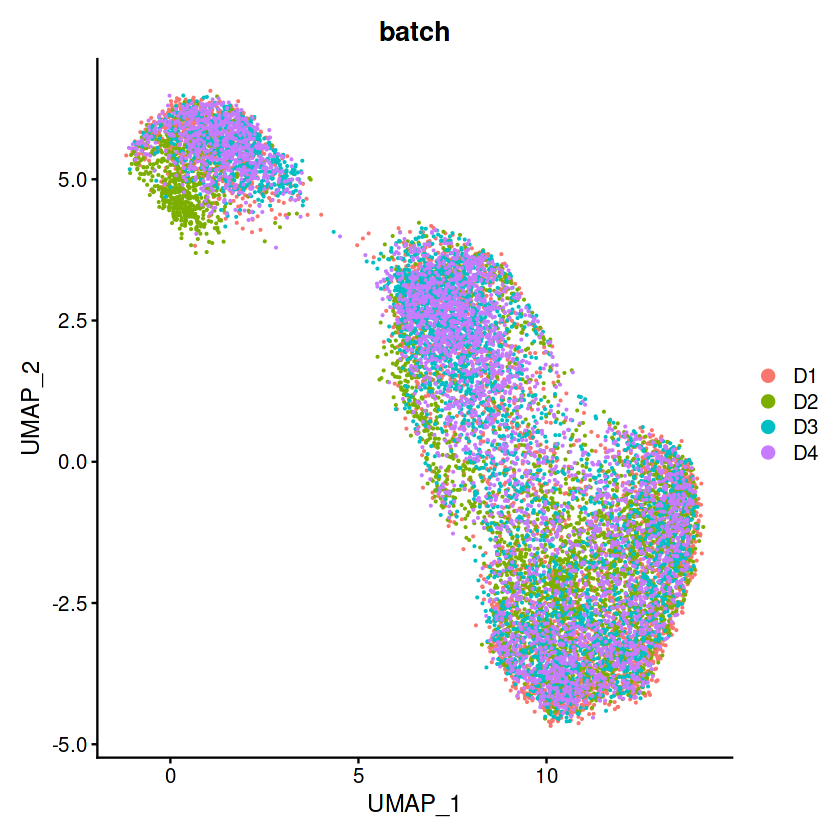

In [99]:
pbmc_batch=CreateSeuratObject(counts = DATA, min.cells = 0, min.features = 0, project = "ALL") 
pbmc_batch@meta.data$batch=BATCH
pbmc_batch@meta.data$orig.ident=char_layer
pbmc_batch=FindVariableFeatures(object = pbmc_batch, selection.method = "vst", nfeatures = 3000)   
# VariableFeatures(object = pbmc_batch)
pbmc_batch <- NormalizeData(object = pbmc_batch, normalization.method = "LogNormalize", scale.factor = 10000)
pbmc_batch <- ScaleData(object = pbmc_batch, features = VariableFeatures(object = pbmc_batch))
pbmc_batch <- RunPCA(object = pbmc_batch, seed.use=123, npcs=50, features = VariableFeatures(object = pbmc_batch), ndims.print=1,nfeatures.print=1)
pbmc_batch <- RunUMAP(pbmc_batch, dims = 1:50, seed.use = 123,n.components=2, umap.method = "umap-learn",  metric="correlation")
DimPlot(pbmc_batch, reduction='umap', group.by='batch', pt.size=0.1) 

In [100]:
pbmc_batch <- RunHarmony(pbmc_batch, 'batch')

Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony converged after 2 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”


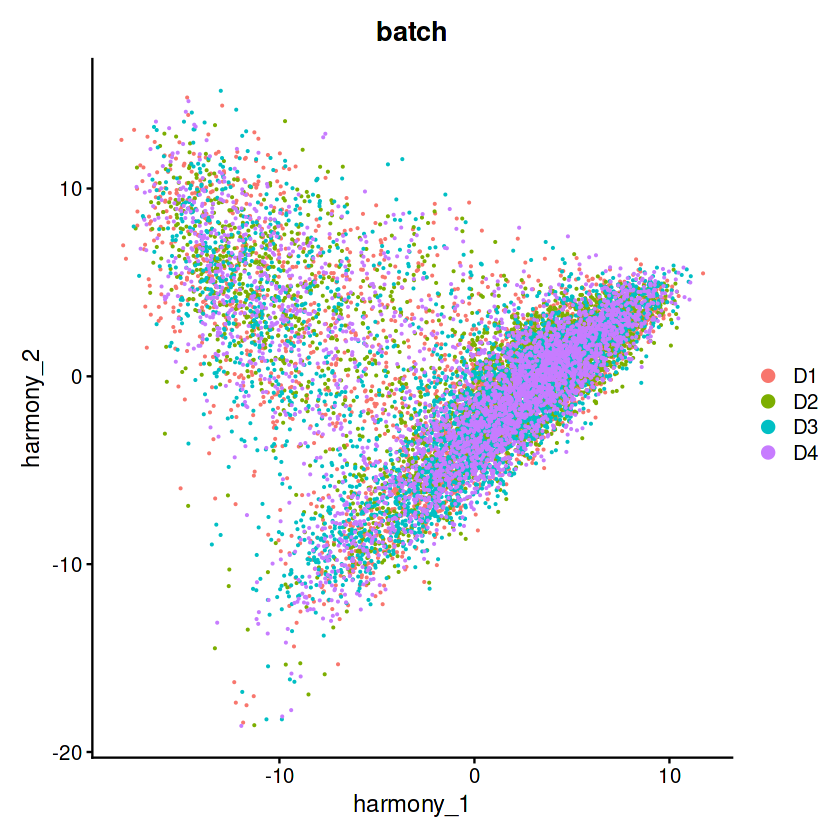

In [101]:
# pbmc_batch <- RunUMAP(pbmc_batch, reduction="harmony")
DimPlot(pbmc_batch, reduction='harmony', group.by='batch', pt.size=0.1) 

In [102]:
pbmc_batch <- FindNeighbors(object = pbmc_batch, reduction='harmony')
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 420610

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8202
Number of communities: 6
Elapsed time: 2 seconds


In [106]:
pbmc_batch <- FindClusters(object = pbmc_batch, resolution = 0.585)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 14364
Number of edges: 420610

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8028
Number of communities: 7
Elapsed time: 2 seconds


In [50]:
plot1 <- DimPlot(pbmc_batch, reduction='umap', group.by='orig.ident', pt.size=0.1)
plot2 <- DimPlot(pbmc_batch, reduction='umap', group.by='seurat_clusters', pt.size=0.1) 

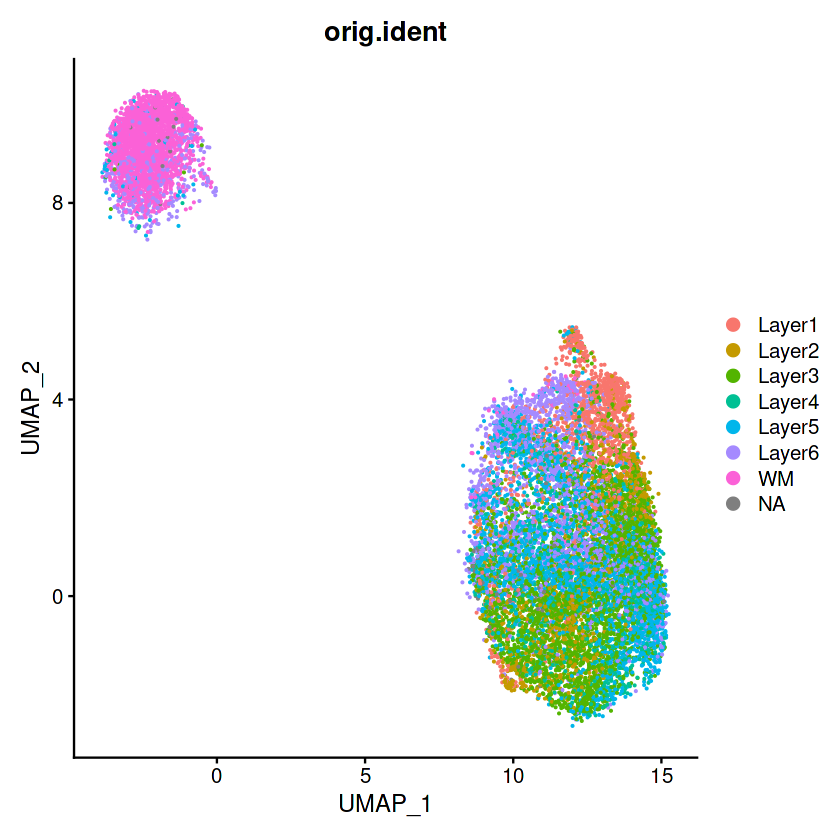

In [51]:
plot1

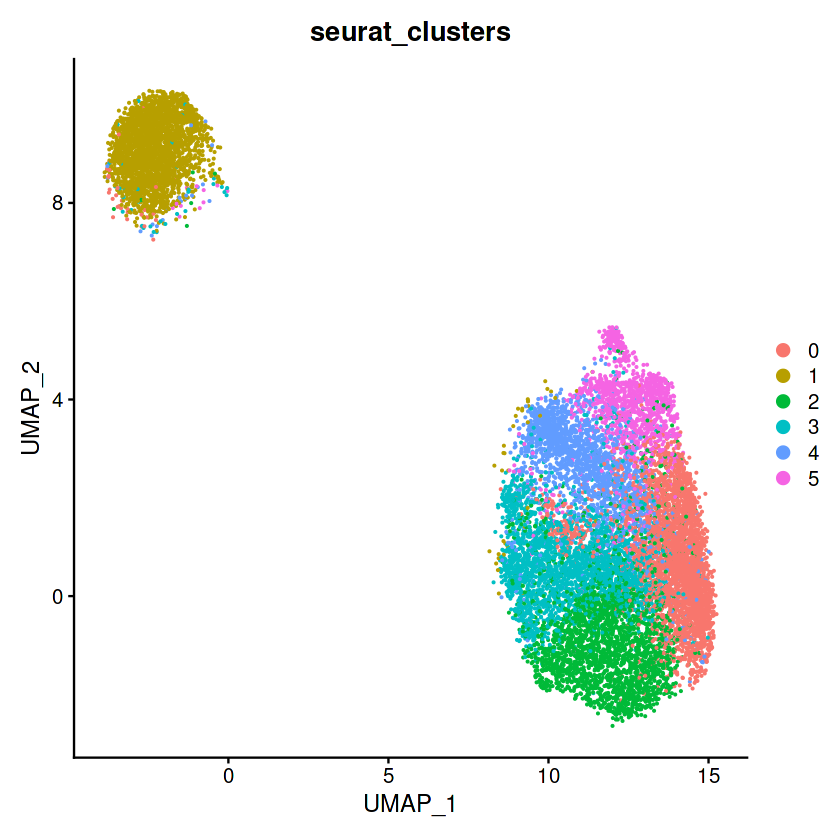

In [52]:
plot2

In [107]:
plot3 <- DimPlot(pbmc_batch, reduction='harmony', group.by='orig.ident', pt.size=0.1)
plot4 <- DimPlot(pbmc_batch, reduction='harmony', group.by='seurat_clusters', pt.size=0.1) 

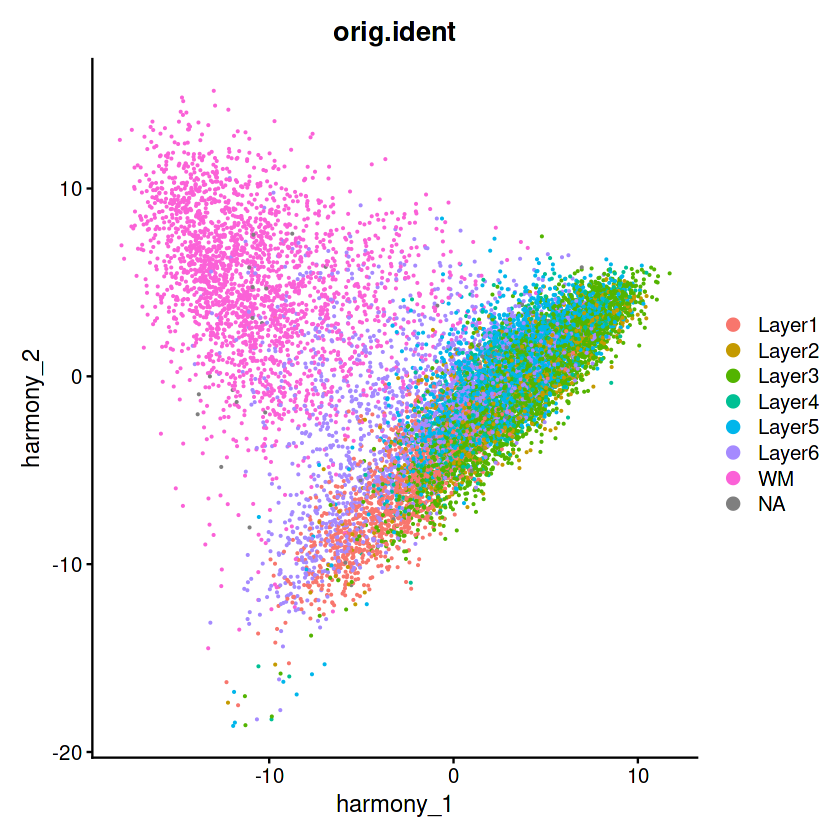

In [108]:
plot3

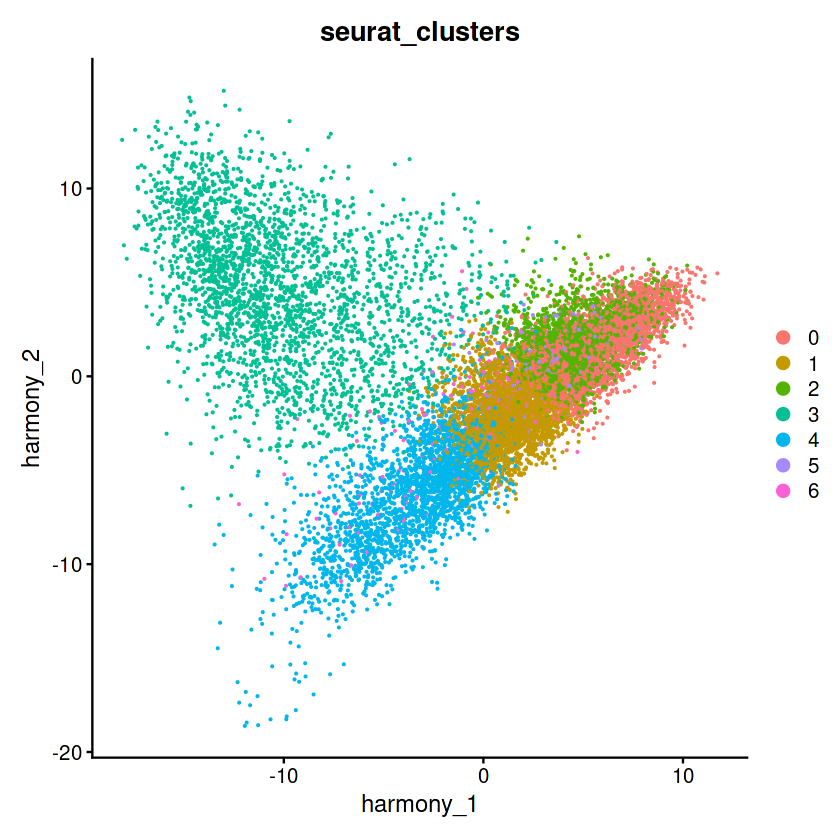

In [109]:
plot4

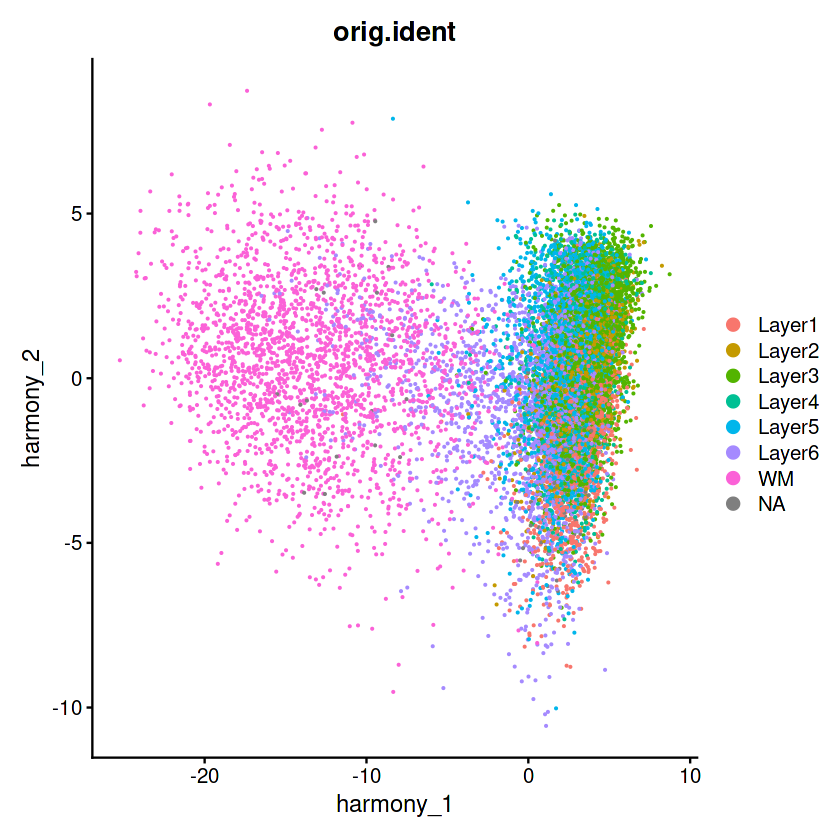

In [63]:
plot3

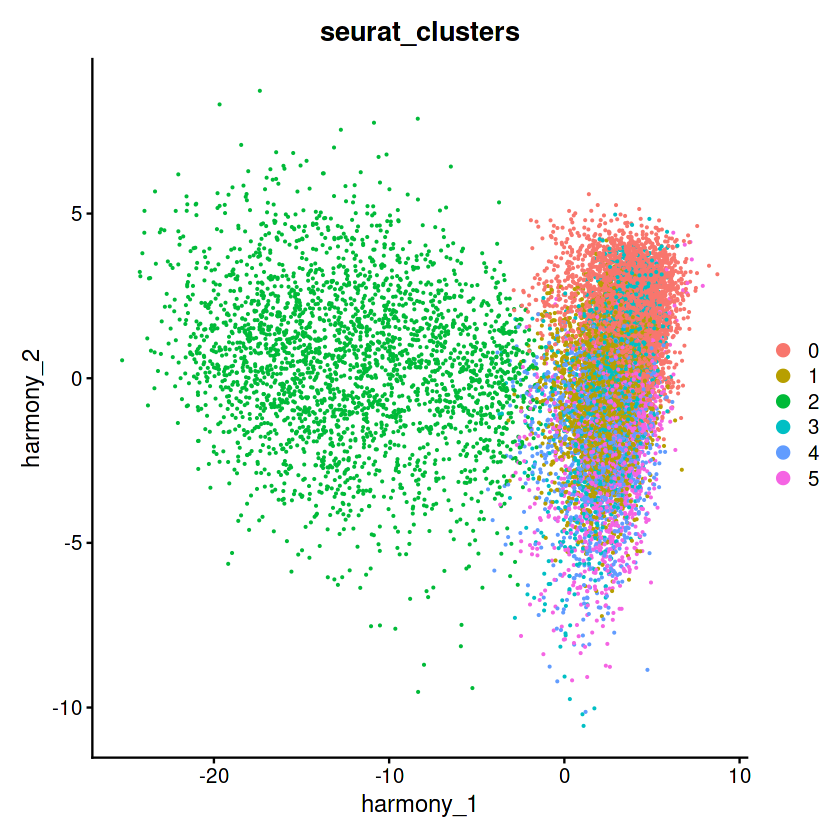

In [64]:
plot4

In [24]:
clusters1 <- pbmc_batch$seurat_clusters

In [45]:
clusters2 <- pbmc_batch$seurat_clusters

In [26]:
values1 <- unlist(clusters1)

In [46]:
values2 <- unlist(clusters2)

In [27]:
length(values1)

[1] 14364

In [47]:
are_values_equal <- all(values1==values2)
are_values_equal

[1] TRUE

In [48]:
unequal_values <- values1 != values2

if (any(unequal_values)){
    print(data.frame(Key = names(values1)[unequal_values], dict1_value = values1[unequal_values], dict2_values = values2[unequal_values]))
} else{
    print('all equal')
}

[1] "all equal"


In [110]:
listings = pbmc_batch@meta.data[['batch']]
numbered_list <- as.integer(factor(listings, levels = unique(listings)))
batch_numeric <- numbered_list
names(batch_numeric) <- colnames(x=pbmc_batch)
pbmc_batch<- AddMetaData(
    object = pbmc_batch,
    metadata = batch_numeric,
    col.name = 'batch_numeric'
    )
# head(x=pbmc)

In [111]:
listings = pbmc_batch@meta.data[['orig.ident']]
numbered_list <- as.integer(factor(listings, levels = unique(listings)))
ident_numeric <- numbered_list
names(ident_numeric) <- colnames(x=pbmc_batch)
pbmc_batch<- AddMetaData(
    object = pbmc_batch,
    metadata = ident_numeric,
    col.name = 'ident_numeric'
    )
# head(x=pbmc)

In [112]:
nona_batch <- pbmc_batch[,!is.na(pbmc_batch$orig.ident)]
nona_batch

An object of class Seurat 
67076 features across 14243 samples within 1 assay 
Active assay: RNA (67076 features, 2000 variable features)
 3 dimensional reductions calculated: pca, umap, harmony

In [113]:
D1_nona_batch <- nona_batch[,nona_batch$batch=='D1']
D2_nona_batch <- nona_batch[,nona_batch$batch=='D2']
D3_nona_batch <- nona_batch[,nona_batch$batch=='D3']
D4_nona_batch <- nona_batch[,nona_batch$batch=='D4']

In [114]:
sil_obj <- silhouette_seurat(pbmc_batch,"seurat_clusters",PCUSE)
silhouette_mean(sil_obj)

[1] 0.07292251

In [115]:
sil_obj <- silhouette_seurat(pbmc_batch,"batch_numeric",PCUSE)
silhouette_mean(sil_obj)

[1] -0.01348866

In [116]:
sil_obj <- silhouette_seurat(nona_batch,"ident_numeric",PCUSE)
silhouette_mean(sil_obj)

[1] 0.02651463

<h2>No Harmony</h2>

In [40]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.255311052746803"                               


In [41]:
score <- ARI(D1_nona_batch$seurat_clusters, D1_nona_batch$orig.ident)
print(c('before batch effect removal D1 ARI score: ', score))

[1] "before batch effect removal D1 ARI score: "
[2] "0.239126187394325"                         


In [42]:
score <- ARI(D2_nona_batch$seurat_clusters, D2_nona_batch$orig.ident)
print(c('before batch effect removal D2 ARI score: ', score))

[1] "before batch effect removal D2 ARI score: "
[2] "0.246066850528572"                         


In [43]:
score <- ARI(D3_nona_batch$seurat_clusters, D3_nona_batch$orig.ident)
print(c('before batch effect removal D3 ARI score: ', score))

[1] "before batch effect removal D3 ARI score: "
[2] "0.295285953634499"                         


In [63]:
score <- ARI(D4_nona_batch$seurat_clusters, D4_nona_batch$orig.ident)
print(c('before batch effect removal D4 ARI score: ', score))

[1] "before batch effect removal D4 ARI score: "
[2] "0.226351367479408"                         


<h2>harmony ---------------

In [117]:
score <- ARI(nona_batch$seurat_clusters, nona_batch$orig.ident)
print(c('before batch effect removal combined ARI score: ', score))

[1] "before batch effect removal combined ARI score: "
[2] "0.321418145166094"                               


In [118]:
score <- ARI(D1_nona_batch$seurat_clusters, D1_nona_batch$orig.ident)
print(c('before batch effect removal D1 ARI score: ', score))

[1] "before batch effect removal D1 ARI score: "
[2] "0.325986019245888"                         


In [119]:
score <- ARI(D2_nona_batch$seurat_clusters, D2_nona_batch$orig.ident)
print(c('before batch effect removal D2 ARI score: ', score))

[1] "before batch effect removal D2 ARI score: "
[2] "0.378397436534009"                         


In [120]:
score <- ARI(D3_nona_batch$seurat_clusters, D3_nona_batch$orig.ident)
print(c('before batch effect removal D3 ARI score: ', score))

[1] "before batch effect removal D3 ARI score: "
[2] "0.327156574951938"                         


In [121]:
score <- ARI(D4_nona_batch$seurat_clusters, D4_nona_batch$orig.ident)
print(c('before batch effect removal D4 ARI score: ', score))

[1] "before batch effect removal D4 ARI score: "
[2] "0.274324166078608"                         


In [122]:
NMI_score_d1 <- NMI(D1_nona_batch$seurat_clusters,D1_nona_batch$orig.ident)
print(c('D1 NMI score: ', NMI_score_d1))

[1] "D1 NMI score: "    "0.388032822973793"


In [123]:
NMI_score_d2 <- NMI(D2_nona_batch$seurat_clusters,D2_nona_batch$orig.ident)
print(c('D2 NMI score: ', NMI_score_d2))

[1] "D2 NMI score: "    "0.405273677722923"


In [124]:
NMI_score_d3 <- NMI(D3_nona_batch$seurat_clusters,D3_nona_batch$orig.ident)
print(c('D3 NMI score: ', NMI_score_d3))

[1] "D3 NMI score: "    "0.388291464294944"


In [125]:
NMI_score_d4 <- NMI(D4_nona_batch$seurat_clusters,D4_nona_batch$orig.ident)
print(c('D4 NMI score: ', NMI_score_d4))

[1] "D4 NMI score: "    "0.343510903011976"


<h2>Integrated w/o spatial info w/o BE Removal Visualization</h2>

In [ ]:
D1_nospatial_nocorrection <- nona_batch[,nona_batch$batch=='D1']
D2_nospatial_nocorrection <- nona_batch[,nona_batch$batch=='D2']
D3_nospatial_nocorrection <- nona_batch[,nona_batch$batch=='D3']

In [ ]:
new_D1_colnames <- lapply(colnames(D1_nospatial_nocorrection), removeColnameSuffix)
new_D1_colnames <- simplify2array(new_D1_colnames)
D1_nospatial_nocorrection <- RenameCells(D1_nospatial_nocorrection, new.names = new_D1_colnames)

In [ ]:
new_D2_colnames <- lapply(colnames(D2_nospatial_nocorrection), removeColnameSuffix)
new_D2_colnames <- simplify2array(new_D2_colnames)
D2_nospatial_nocorrection <- RenameCells(D2_nospatial_nocorrection, new.names = new_D2_colnames)

In [ ]:
new_D3_colnames <- lapply(colnames(D3_nospatial_nocorrection), removeColnameSuffix)
new_D3_colnames <- simplify2array(new_D3_colnames)
D3_nospatial_nocorrection <- RenameCells(D3_nospatial_nocorrection, new.names = new_D3_colnames)

In [ ]:
D1_nospatial_nocorrection[["Spatial"]] <- CreateAssayObject(counts = D1_nospatial_nocorrection[["RNA"]]@data)
D2_nospatial_nocorrection[["Spatial"]] <- CreateAssayObject(counts = D2_nospatial_nocorrection[["RNA"]]@data)
D3_nospatial_nocorrection[["Spatial"]] <- CreateAssayObject(counts = D3_nospatial_nocorrection[["RNA"]]@data)

In [ ]:
sample_674_name <- '151674'
D1_nospatial_nocorrection <- addImage(D1_nospatial_nocorrection, sample_674_name, download_dir, new_name=glue("image_{sample_674_name}"))
sample_675_name <- '151675'
D2_nospatial_nocorrection <- addImage(D2_nospatial_nocorrection, sample_675_name, download_dir, new_name=glue("image_{sample_675_name}"))
sample_674_name <- '151674'
D3_nospatial_nocorrection <- addImage(D3_nospatial_nocorrection, sample_674_name, download_dir, new_name=glue("image_{sample_674_name}"))

In [ ]:
DefaultAssay(D1_nospatial_nocorrection) <- "Spatial"
DefaultAssay(D2_nospatial_nocorrection) <- "Spatial"
DefaultAssay(D3_nospatial_nocorrection) <- "Spatial"

In [ ]:
D1_nospatial_nocorrection
D2_nospatial_nocorrection
D3_nospatial_nocorrection

In [ ]:
D1_nospatial_nocorrection
D2_nospatial_nocorrection
D3_nospatial_nocorrection

In [ ]:
layers_col <- c('WM'=cols[3,1], 'Layer1'=cols[1,1] ,'Layer2'=cols[6,1], 'Layer3'=cols[2,1], 'Layer4'=cols[7,1], 'Layer5'=cols[5,1], 'Layer6'=cols[4,1])
b_colors_674 <- c('5'=cols[3,1], '4'=cols[1,1] ,'3'=cols[6,1], '1'=cols[2,1], '2'=cols[7,1], '0'=cols[5,1], '6'=cols[4,1])
b_colors_675 <- c('6'=cols[3,1], '4'=cols[1,1] ,'5'=cols[6,1], '1'=cols[2,1], '3'=cols[7,1], '2'=cols[5,1], '0'=cols[4,1])
b_colors_674 <- c('5'=cols[3,1], '4'=cols[1,1] ,'3'=cols[6,1], '1'=cols[2,1], '6'=cols[7,1], '0'=cols[5,1], '2'=cols[4,1]) 

In [ ]:
to_test <- colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$orig.ident=="Layer2"])
for (i in unique(D3_nospatial_nocorrection$seurat_clusters)){
score <- jaccard(to_test, colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$seurat_clusters==i]))
print(paste0(i, " - ",score))
}

In [ ]:
to_test <- colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$seurat_clusters=='6'])
for (i in unique(D3_nospatial_nocorrection$orig.ident)){
score <- jaccard(colnames(D3_nospatial_nocorrection[ ,D3_nospatial_nocorrection$orig.ident==i]), to_test)
print(paste0(i, " - ",score))
}

In [ ]:
to_test <- colnames(D3_corrected[ ,D3_corrected$orig.ident=="Layer2"])
for (i in unique(D3_corrected$seurat_clusters)){
score <- jaccard(to_test, colnames(D3_corrected[ ,D3_corrected$seurat_clusters==i]))
print(paste0(i, " - ",score))
}

In [ ]:
to_test <- colnames(D3_corrected[ ,D3_corrected$seurat_clusters=='6'])
for (i in unique(D3_corrected$orig.ident)){
score <- jaccard(colnames(D3_corrected[ ,D3_corrected$orig.ident==i]), to_test)
print(paste0(i, " - ",score))
}

In [ ]:
library(caret)

In [ ]:
D1_nospatial_nocorrection_plot_seurat <- SpatialDimPlot(D1_nospatial_nocorrection, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = b_colors_674)
D2_nospatial_nocorrection_plot_seurat <- SpatialDimPlot(D2_nospatial_nocorrection, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = b_colors_675)
D3_nospatial_nocorrection_plot_seurat <- SpatialDimPlot(D3_nospatial_nocorrection, group.by='seurat_clusters', label = TRUE, label.size = 7) + theme(legend.position = "right") + scale_fill_manual(values = b_colors_674)

In [ ]:
# ggsave("Truth_674_label.png",D3_corrected_plot_layers)

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 20)
wrap_plots(D1_corrected_plot_layers, D2_corrected_plot_layers, D3_corrected_plot_layers, 
           D1_corrected_plot_seurat, D2_corrected_plot_seurat, D3_corrected_plot_seurat, 
           D1_nospatial_nocorrection_plot_seurat, D2_nospatial_nocorrection_plot_seurat, D3_nospatial_nocorrection_plot_seurat, ncol=3, nrow=3)

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 10)
clust_subset_plot_1 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 4],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")
clust_subset_plot_2 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 3],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")
clust_subset_plot_3 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 5],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")
clust_subset_plot_4 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 2],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")
clust_subset_plot_5 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 6],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")
clust_subset_plot_6 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 1],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")
clust_subset_plot_7 <- SpatialDimPlot(D3_corrected[, D3_corrected$seurat_clusters == 0],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = colors_674) + theme(legend.position = "none")

In [ ]:
layers_col <- c('WM'=cols[3,1], 'Layer1'=cols[1,1] ,'Layer2'=cols[6,1], 'Layer3'=cols[2,1], 'Layer4'=cols[7,1], 'Layer5'=cols[5,1], 'Layer6'=cols[4,1])
b_colors_674 <- c('5'=cols[3,1], '4'=cols[1,1] ,'3'=cols[6,1], '1'=cols[2,1], '2'=cols[7,1], '0'=cols[5,1], '6'=cols[4,1])
b_colors_675 <- c('6'=cols[3,1], '4'=cols[1,1] ,'5'=cols[6,1], '1'=cols[2,1], '3'=cols[7,1], '2'=cols[5,1], '0'=cols[4,1])
b_colors_674 <- c('5'=cols[3,1], '4'=cols[1,1] ,'3'=cols[6,1], '1'=cols[2,1], '6'=cols[7,1], '0'=cols[5,1], '2'=cols[4,1]) 

In [ ]:
layers_col <- c('WM'=cols[3,1], 'Layer1'=cols[1,1] ,'Layer2'=cols[6,1], 'Layer3'=cols[2,1], 'Layer4'=cols[7,1], 'Layer5'=cols[5,1], 'Layer6'=cols[4,1])
colors_674 <- c('4'=cols[3,1], '3'=cols[1,1], '6'=cols[6,1], '2'=cols[2,1], '0'=cols[7,1], '1'=cols[5,1], '5'=cols[4,1])
colors_675 <- c('5'=cols[3,1], '3'=cols[1,1], '2'=cols[6,1], '0'=cols[2,1], '6'=cols[7,1], '1'=cols[5,1], '4'=cols[4,1])
colors_674 <- c('4'=cols[3,1], '3'=cols[1,1], '5'=cols[6,1], '2'=cols[2,1], '6'=cols[7,1], '1'=cols[5,1], '0'=cols[4,1]) 

In [ ]:
subset_plot_1 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 2],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674)
subset_plot_1
ggsave("Base_Layer6.png",subset_plot_1)

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 10)
b_subset_plot_1 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 5],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
b_subset_plot_2 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 4],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
b_subset_plot_3 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 3],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
b_subset_plot_4 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 1],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
b_subset_plot_5 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 6],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
b_subset_plot_6 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 0],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
b_subset_plot_7 <- SpatialDimPlot(D3_nospatial_nocorrection[, D3_nospatial_nocorrection$seurat_clusters == 2],crop=FALSE, group.by='seurat_clusters', label = FALSE, label.size = 9, image.alpha = 0.3) + scale_fill_manual(values = b_colors_674) + theme(legend.position = "none")
# wrap_plots(subset_plot_1, subset_plot_2, subset_plot_3) 

In [ ]:
options(repr.plot.width = 30, repr.plot.height = 10)
truth_plot_1 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "WM"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none") 
truth_plot_2 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer1"],crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none")
truth_plot_3 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer2"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none")
truth_plot_4 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer3"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none")
truth_plot_5 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer4"],crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none")
truth_plot_6 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer5"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none")
truth_plot_7 <- SpatialDimPlot(D3_corrected[, D3_corrected$orig.ident == "Layer6"], crop=FALSE, group.by='orig.ident', label = TRUE, label.size = 2.5, image.alpha = 0.3) + scale_fill_manual(values = layers_col) + theme(legend.position = "none")
# wrap_plots(subset_plot_1, subset_plot_2, subset_plot_3) 

In [ ]:
plots_all <- wrap_plots(truth_plot_1, truth_plot_2, truth_plot_3, truth_plot_4, truth_plot_5, truth_plot_6, truth_plot_7,
                        b_subset_plot_1, b_subset_plot_2, b_subset_plot_3, b_subset_plot_4, b_subset_plot_5, b_subset_plot_6, b_subset_plot_7,
                        clust_subset_plot_1, clust_subset_plot_2, clust_subset_plot_3, clust_subset_plot_4, clust_subset_plot_5, clust_subset_plot_6, clust_subset_plot_7,
                       ncol=7)

ggsave("plot_all.png", plots_all)

In [ ]:
plots_all <- wrap_plots(truth_plot_7, b_subset_plot_7, clust_subset_plot_7, nrow=3
                        )

ggsave("plot_Layer6.png", plots_all)

In [ ]:
dlfpc_nospatial_nocorrection.merge <- merge(D1_nospatial_nocorrection, D2_nospatial_nocorrection)
dlfpc_nospatial_nocorrection.merge <- merge(dlfpc_nospatial_nocorrection.merge, D3_nospatial_nocorrection)

In [ ]:
D1_nospatial_nocorr_seurat <- SpatialDimPlot(dlfpc_nospatial_nocorrection.merge, images="image_151674", group.by="seurat_clusters")
D2_nospatial_nocorr_seurat <- SpatialDimPlot(dlfpc_nospatial_nocorrection.merge, images="image_151675", group.by="seurat_clusters")
D3_nospatial_nocorr_seurat <- SpatialDimPlot(dlfpc_nospatial_nocorrection.merge, images="image_151674", group.by="seurat_clusters")

In [ ]:
wrap_plots(D1_orig, D2_orig, D3_orig, D1_nospatial_nocorr_seurat, D2_nospatial_nocorr_seurat, D3_nospatial_nocorr_seurat, ncol=3)

In [ ]:
nospatial_nocorr_rna_path <- file.path(output_dir, output_default_nocorr_rna)

jpeg(filename = file.path(nospatial_nocorr_rna_path, glue("{output_default_nocorr_rna}_151674.jpg")), height = 400, width = 500, quality = 100)
D1_nospatial_nocorr_seurat
dev.off()
jpeg(filename = file.path(nospatial_nocorr_rna_path, glue("{output_default_nocorr_rna}_151675.jpg")), height = 400, width = 500, quality = 100)
D2_nospatial_nocorr_seurat
dev.off()
jpeg(filename = file.path(nospatial_nocorr_rna_path, glue("{output_default_nocorr_rna}_151674.jpg")), height = 400, width = 500, quality = 100)
D3_nospatial_nocorr_seurat
dev.off()

options(repr.plot.width = 21, repr.plot.height = 21)
SpatialDimPlot(dlfpc_nospatial_nocorrection.merge, group.by=c("batch", "seurat_clusters", "orig.ident"))

<h2>End of Integrated w/o spatial info w/o BE Removal Visualization</h2>